# Learning Urbanization Patterns from Multispectral Satellite Data

Satellite-based assessment of urbanization plays a central role in a wide range of applications, including urban planning, environmental monitoring and climate impact analysis. Recent advances in Earth Observation have enabled the large-scale availability of high-resolution satellite imagery, while global settlement datasets provide coarse but consistent indicators of human presence. However, linking these two sources of information remains a challenging task.

This study relies on the [EuroSAT](https://github.com/phelber/eurosat) dataset, a collection of multi-spectral satellite image patches derived from the Sentinel-2 mission operated by the European Space Agency (ESA) within the Copernicus programme. EuroSAT provides geo-referenced image patches of size 64×64 pixels, extracted from Sentinel-2 Level-2A products and covering a wide range of land-use and land-cover categories across Europe.

Each image patch is associated with geographic coordinates and enriched with a continuous built-up intensity value derived from the [Global Human Settlement Layer (GHSL)](https://human-settlement.emergency.copernicus.eu/download.php). GHSL is a global, remotely sensed dataset produced by the Joint Research Centre (JRC) of the European Commission, providing estimates of built-up surface at an approximate spatial resolution of 1 km.

As a result, the prediction task inherently involves a scale mismatch: the objective is to infer a coarse-scale built-up intensity indicator from fine-scale satellite observations. This mismatch introduces ambiguity, as a single GHSL value may correspond to heterogeneous local patterns that are only partially visible within a small image patch.

Moreover, GHSL should be interpreted as a proxy rather than a precise ground truth. Transitional areas, mixed land-use regions and heterogeneous urban morphologies often lead to overlapping visual patterns that cannot be cleanly separated by fixed thresholds or simple decision rules. Consequently, discriminating between urbanized and non-urbanized areas from satellite imagery is intrinsically noisy and ill-posed when approached as a standard supervised classification problem.

The objective of this work is twofold. First, we aim to understand which sources of information—spectral, spatial or contextual—are most informative for capturing urbanization patterns in satellite imagery. Second, we investigate whether built-up intensity can be reliably inferred from satellite images alone, without relying on handcrafted geographic or tabular proxies.

To address these challenges, we move beyond purely feature-based or regression-driven approaches and adopt a representation learning perspective. Rather than forcing hard labels derived from GHSL, we treat urbanization as a continuous and structured phenomenon and seek to learn image embeddings that reflect relative degrees of built-up intensity. This framework enables the exploitation of visual cues encoded in satellite imagery while explicitly accounting for label uncertainty and scale mismatch.

The proposed methodology combines data-driven stratification of weak supervisory signals with metric learning based on a Siamese neural network. By learning an ordered embedding space from satellite images, the final binary discrimination between urbanized and non-urbanized areas is performed downstream, allowing for a flexible and robust evaluation of urbanization patterns.


In [18]:
# ============================================================
# 1) Installations (CPU)
# ============================================================
!pip -q install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu
!pip -q install torchgeo rasterio pyproj geopandas shapely folium tqdm matplotlib seaborn
!pip -q install requests scikit-learn xgboost

# ============================================================
# 2) Imports
# ============================================================
import os
import glob
from pathlib import Path
from collections import Counter
import math
import zipfile
import random
import requests

import numpy as np
import pandas as pd
import rasterio
from pyproj import Transformer
from tqdm import tqdm
import matplotlib as mpl
from matplotlib.patches import Patch
import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium.plugins import MarkerCluster
import geopandas as gpd
from IPython.display import display

from PIL import Image

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torchvision.models import resnet18
import torch.nn.functional as F

from torchgeo.datasets import EuroSAT

from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight

from sklearn.metrics import (
    r2_score,
    mean_squared_error,
    mean_absolute_error,
    accuracy_score,
    precision_recall_fscore_support,
    confusion_matrix,
    classification_report,
)

from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor

import xgboost as xgb
from xgboost import XGBRegressor, XGBClassifier

from scipy.stats import spearmanr

# ============================================================
# 3) Reproducibility + device
# ============================================================
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

Using device: cuda


## Exploratory data analysis (EDA)

### Overview of the complete EuroSAT–GHSL dataset
We begin with a **global overview** of the complete EuroSAT dataset enriched with GHSL values, without imposing class-based or geographic restrictions. By analyzing the dataset at this global level, we establish a baseline understanding of the prediction problem and avoid prematurely attributing explanatory power to semantic classes or geographic regions.

100%|██████████| 314k/314k [00:00<00:00, 51.1MB/s]
100%|██████████| 2.07G/2.07G [00:08<00:00, 233MB/s]


Dataset root: /content/eurosat_data/ds/images/remote_sensing/otherDatasets/sentinel_2/tif
Found GeoTIFFs: 27,000


Reading GeoTIFF georeferencing: 100%|██████████| 27000/27000 [01:40<00:00, 267.75it/s]


=== EuroSAT (complete, raw) — quick summary ===
Rows: 27,000 | Columns: 7
Unique classes: 10


,filepath,class,native_crs,center_x_native,center_y_native,lon,lat
0,/content/eurosat_data/ds/images/remote_sensing...,AnnualCrop,EPSG:32635,624922.417465,4.876966e+06,28.559055,44.035220
1,/content/eurosat_data/ds/images/remote_sensing...,AnnualCrop,EPSG:32630,601215.010626,4.326950e+06,-1.829726,39.085801
2,/content/eurosat_data/ds/images/remote_sensing...,AnnualCrop,EPSG:32631,590716.460833,5.425672e+06,4.239720,48.977295
3,/content/eurosat_data/ds/images/remote_sensing...,AnnualCrop,EPSG:32631,579886.990703,5.416090e+06,4.089878,48.892610
4,/content/eurosat_data/ds/images/remote_sensing...,AnnualCrop,EPSG:32633,712547.845039,5.746948e+06,18.084960,51.832851



Saved: /content/eurosat_georef_sample.csv


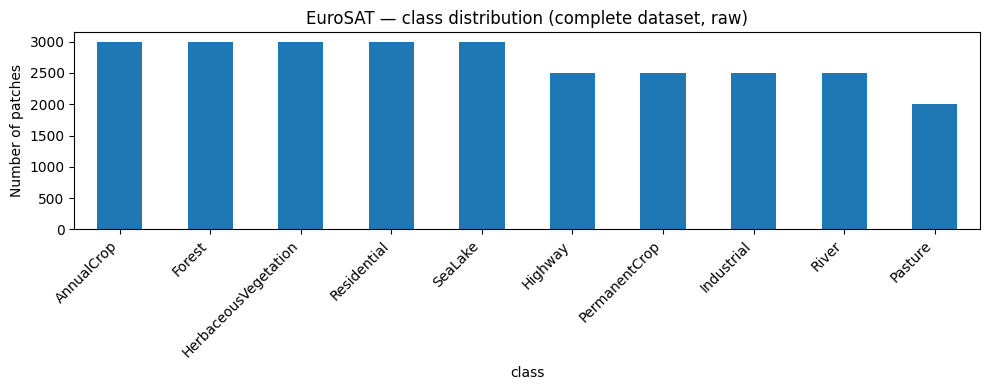

In [2]:
# ============================================================
# SETUP + DOWNLOAD EuroSAT (all bands, GeoTIFF)
#          + BUILD METADATA DF (lat/lon) + SAVE CSV
# ============================================================

# ------------------------------------------------------------
# Download EuroSAT (all bands, GeoTIFF) via TorchGeo
# ------------------------------------------------------------
ROOT = "/content/eurosat_data"
os.makedirs(ROOT, exist_ok=True)

ds = EuroSAT(root=ROOT, download=True)
print("Dataset root:", ds.root)

base = Path(ds.root)
tif_paths = sorted(glob.glob(str(base / "**" / "*.tif"), recursive=True))
print("Found GeoTIFFs:", f"{len(tif_paths):,}")

# ------------------------------------------------------------
# 3) Helpers
# ------------------------------------------------------------
def get_class_from_path(p: str) -> str:
    """Extract the EuroSAT class label from the folder name."""
    return Path(p).parts[-2]

def compute_center_latlon(src, cx, cy):
    """
    Convert center coordinates (cx, cy) from the native CRS to WGS84 (EPSG:4326).
    This is needed to place each patch on a global map and to join with country polygons.
    """
    crs = src.crs
    if crs is None:
        # If CRS is missing, we fall back to treating (cx, cy) as lon/lat (best-effort).
        return float(cx), float(cy)

    epsg = crs.to_epsg()
    if epsg == 4326:
        return float(cx), float(cy)

    transformer = Transformer.from_crs(crs, "EPSG:4326", always_xy=True)
    lon, lat = transformer.transform(cx, cy)
    return float(lon), float(lat)

# ------------------------------------------------------------
# 4) Build the COMPLETE metadata DataFrame (NO filtering)
# ------------------------------------------------------------
rows = []
for p in tqdm(tif_paths, desc="Reading GeoTIFF georeferencing"):
    with rasterio.open(p) as src:
        b = src.bounds
        cx = (b.left + b.right) / 2.0
        cy = (b.bottom + b.top) / 2.0
        lon, lat = compute_center_latlon(src, cx, cy)

        rows.append({
            "filepath": p,
            "class": get_class_from_path(p),
            "native_crs": str(src.crs) if src.crs else None,
            "center_x_native": float(cx),
            "center_y_native": float(cy),
            "lon": lon,
            "lat": lat,
        })

df_complete = pd.DataFrame(rows)

# Quick sanity checks (paper-friendly)
print("\n=== EuroSAT (complete, raw) — quick summary ===")
print("Rows:", f"{len(df_complete):,}", "| Columns:", df_complete.shape[1])
print("Unique classes:", df_complete["class"].nunique())
display(df_complete.head(5))

CSV_PATH = "/content/eurosat_georef_sample.csv"
df_complete.to_csv(CSV_PATH, index=False)
print("\nSaved:", CSV_PATH)

# Class distribution (compact)
class_counts = df_complete["class"].value_counts()
plt.figure(figsize=(10,4))
class_counts.plot(kind="bar")
plt.title("EuroSAT — class distribution (complete dataset, raw)")
plt.ylabel("Number of patches")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


<Figure size 1200x600 with 0 Axes>

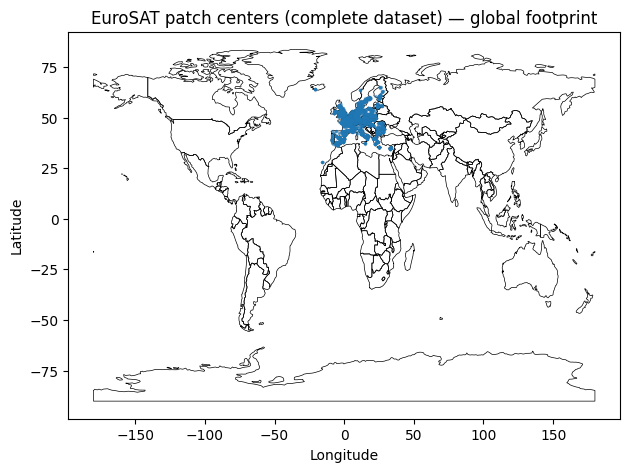

In [3]:
# ============================================================
# GEO EDA (COMPLETE DATASET): static map + interactive map
# ============================================================

# --- 1) GeoDataFrame ---
gdf = gpd.GeoDataFrame(
    df_complete.copy(),
    geometry=gpd.points_from_xy(df_complete["lon"], df_complete["lat"]),
    crs="EPSG:4326"
)

# --- 2) World borders (Natural Earth, 110m) ---
# Note: GeoPandas built-in datasets were removed in GeoPandas>=1.0,
# so we load Natural Earth directly from the official source.
NE_URL = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(NE_URL).to_crs("EPSG:4326")

# --- 3) Static map (paper-friendly) ---
plt.figure(figsize=(12, 6))
ax = world.plot(edgecolor="black", linewidth=0.5, facecolor="none")

# Plot a subset to avoid heavy overplotting
gdf.sample(min(5000, len(gdf)), random_state=42).plot(
    ax=ax, markersize=2, alpha=0.25
)

plt.title("EuroSAT patch centers (complete dataset) — global footprint")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()

# --- 4) Interactive map (optional) ---
SHOW_FOLIUM = True  # set False if you only want the static figure for the paper

if SHOW_FOLIUM:
    df_map = df_complete.sample(min(1500, len(df_complete)), random_state=42).copy()

    # Always create a fresh map object to avoid duplicated rendering on re-runs
    m = folium.Map(location=[45.0, 10.0], zoom_start=3, tiles="CartoDB positron")
    cluster = MarkerCluster(name="EuroSAT centers").add_to(m)

    for _, r in df_map.iterrows():
        folium.CircleMarker(
            location=[r["lat"], r["lon"]],
            radius=2,
            fill=True,
            fill_opacity=0.6,
            opacity=0.4,
            popup=str(r["class"]),
        ).add_to(cluster)

    folium.LayerControl().add_to(m)
    display(m)


=== Countries (EuroSAT complete dataset) — top 20 ===


,country,n_patches
0,France,5088
1,Germany,4465
2,United Kingdom,2948
3,Spain,2240
4,Poland,1302
5,Italy,1260
6,Austria,1162
7,Netherlands,1039
8,Greece,936
9,Sweden,813


Coverage known: 98.67% | Unknown: 358 / 27,000
Saved: /content/eurosat_country_counts.csv


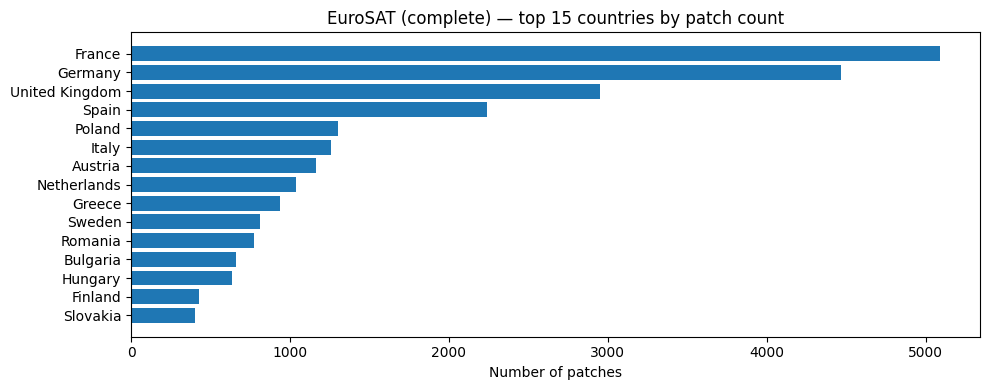

In [4]:
# ============================================================
# COUNTRY SUMMARY (COMPLETE DATASET) via spatial join
# ============================================================

# Administrative boundaries (Natural Earth 110m)
NE_URL = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world_admin = gpd.read_file(NE_URL)[["ADMIN","ADM0_A3","geometry"]].to_crs("EPSG:4326")
world_admin = world_admin.rename(columns={"ADMIN":"country","ADM0_A3":"iso_a3"})

# Spatial join: "intersects" is more robust than "within" for points near borders
joined = gpd.sjoin(gdf, world_admin, how="left", predicate="intersects")

country_counts = (
    joined["country"].fillna("Unknown")
    .value_counts()
    .reset_index()
)
country_counts.columns = ["country", "n_patches"]

print("=== Countries (EuroSAT complete dataset) — top 20 ===")
display(country_counts.head(20))

unknown = int(country_counts.loc[country_counts["country"]=="Unknown", "n_patches"].sum())
known = int(country_counts["n_patches"].sum()) - unknown
print(f"Coverage known: {100*known/len(df_complete):.2f}% | Unknown: {unknown:,} / {len(df_complete):,}")

country_counts_path = "/content/eurosat_country_counts.csv"
country_counts.to_csv(country_counts_path, index=False)
print("Saved:", country_counts_path)

# Optional: plot top countries (paper-friendly)
topN = 15
plt.figure(figsize=(10,4))
tmp = country_counts.head(topN).iloc[::-1]
plt.barh(tmp["country"], tmp["n_patches"])
plt.title(f"EuroSAT (complete) — top {topN} countries by patch count")
plt.xlabel("Number of patches")
plt.tight_layout()
plt.show()


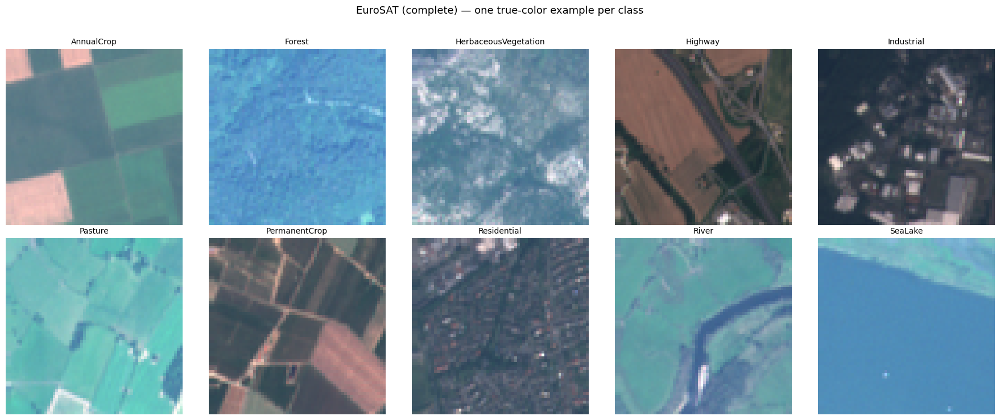

In [5]:
# ============================================================
# TRUE COLOR GRID — One image per class (RGB = B4,B3,B2)
# ============================================================

def read_rgb_truecolor(filepath):
    """
    True-color rendering for Sentinel-2:
    RGB = (B4,B3,B2). We apply only a minimal normalization to display
    the image (no contrast stretching).
    """
    with rasterio.open(filepath) as src:
        b4 = src.read(4).astype(np.float32)  # Red
        b3 = src.read(3).astype(np.float32)  # Green
        b2 = src.read(2).astype(np.float32)  # Blue

    rgb = np.dstack([b4, b3, b2])

    # Minimal normalization for visualization (avoid saturation)
    mx = np.max(rgb)
    if mx > 0:
        rgb = rgb / mx
    return np.clip(rgb, 0, 1)

# --- select 1 deterministic sample per class ---
classes = sorted(df_complete["class"].unique())
samples = []
for c in classes:
    fp = df_complete.loc[df_complete["class"] == c, "filepath"].sample(1, random_state=42).iloc[0]
    samples.append((c, fp))

# --- grid layout ---
n = len(samples)
ncols = 5
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3.6*ncols, 3.6*nrows))
axes = np.array(axes).reshape(-1)

for i, (c, fp) in enumerate(samples):
    rgb = read_rgb_truecolor(fp)
    axes[i].imshow(rgb)
    axes[i].set_title(c, fontsize=10)
    axes[i].axis("off")

# hide empty slots
for j in range(n, len(axes)):
    axes[j].axis("off")

plt.suptitle("EuroSAT (complete) — one true-color example per class", y=1.02, fontsize=13)
plt.tight_layout()
plt.show()


Downloaded: /content/_ghsl_dl/GHS_BUILT_S_E2020_GLOBE_R2023A_4326_3ss_V1_0.zip
Extracting ZIP...
GHSL raster: /content/_ghsl_dl/GHS_BUILT_S_E2020_GLOBE_R2023A_4326_3ss_V1_0.tif

=== GHSL sampling summary (RAW, complete dataset) ===


,ghsl_built
count,27000.000000
mean,459.991882
std,950.121643
min,0.000000
25%,0.000000
50%,0.000000
75%,96.000000
max,6697.000000


NaN in ghsl_built: 0
ghsl_built == 0: 18,365 / 27,000 (68.0%)
Saved: /content/eurosat_with_ghsl.csv


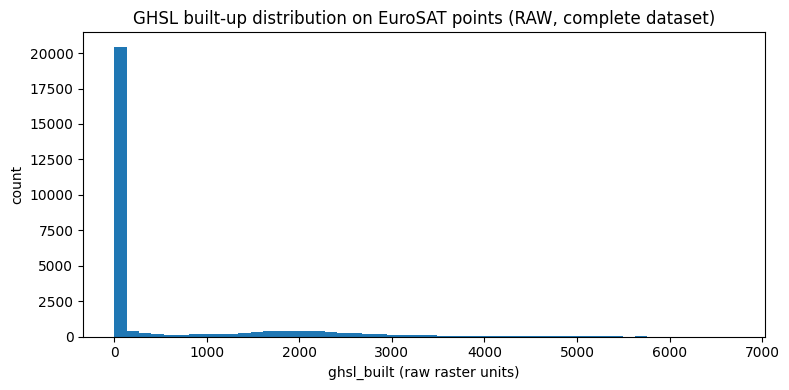

In [6]:
# ============================================================
# GHSL download + efficient sampling (RAW) + SAVE eurosat_with_ghsl.csv
#   - Keeps GHSL values exactly as stored in the raster
#   - No normalization, no duplicate target columns
# ============================================================

GHSL_URL = "https://jeodpp.jrc.ec.europa.eu/ftp/jrc-opendata/GHSL/GHS_BUILT_S_GLOBE_R2023A/GHS_BUILT_S_E2020_GLOBE_R2023A_4326_3ss/V1-0/GHS_BUILT_S_E2020_GLOBE_R2023A_4326_3ss_V1_0.zip"

DL_DIR = "/content/_ghsl_dl"
os.makedirs(DL_DIR, exist_ok=True)

print("Downloading GHSL...")
r = requests.get(GHSL_URL, stream=True, timeout=300)
r.raise_for_status()

fname = (r.headers.get("Content-Disposition","").split("filename=")[-1].strip('"')
         if "filename=" in r.headers.get("Content-Disposition","") else os.path.basename(GHSL_URL))
if not fname:
    fname = "ghsl_download.zip"

dpath = os.path.join(DL_DIR, fname)

with open(dpath, "wb") as f:
    for chunk in r.iter_content(chunk_size=1024*1024):
        if chunk:
            f.write(chunk)

print("Downloaded:", dpath)

# Extract tif (or use directly if already a tif)
GHSL_PATH = None
if dpath.lower().endswith(".zip"):
    print("Extracting ZIP...")
    with zipfile.ZipFile(dpath, "r") as z:
        z.extractall(DL_DIR)

    for root, _, files in os.walk(DL_DIR):
        for fn in files:
            if fn.lower().endswith(".tif"):
                GHSL_PATH = os.path.join(root, fn)
                break
        if GHSL_PATH:
            break
elif dpath.lower().endswith(".tif"):
    GHSL_PATH = dpath

assert GHSL_PATH is not None, "No .tif found after download. Check GHSL_URL."
print("GHSL raster:", GHSL_PATH)

# Efficient sampling: open raster once and sample all points in batch
coords = list(zip(df_complete["lon"].astype(float).tolist(),
                  df_complete["lat"].astype(float).tolist()))

with rasterio.open(GHSL_PATH) as src:
    sampled = np.array([v[0] for v in src.sample(coords)], dtype=np.float32)

# Store GHSL exactly as-is (RAW raster values)
df_complete["ghsl_built"] = sampled

print("\n=== GHSL sampling summary (RAW, complete dataset) ===")
display(df_complete["ghsl_built"].describe())

nan_count = int(df_complete["ghsl_built"].isna().sum())
print("NaN in ghsl_built:", nan_count)

zero_count = int((df_complete["ghsl_built"] == 0).sum())
print(f"ghsl_built == 0: {zero_count:,} / {len(df_complete):,} ({100*zero_count/len(df_complete):.1f}%)")

# Save enriched dataset
out_csv = "/content/eurosat_with_ghsl.csv"
df_complete.to_csv(out_csv, index=False)
print("Saved:", out_csv)

# Histogram on RAW values
plt.figure(figsize=(8,4))
vals = df_complete["ghsl_built"].dropna().values
plt.hist(vals, bins=50)
plt.title("GHSL built-up distribution on EuroSAT points (RAW, complete dataset)")
plt.xlabel("ghsl_built (raw raster units)")
plt.ylabel("count")
plt.tight_layout()
plt.show()


### Dataset filtering and selection criteria

To ensure a well-defined and meaningful prediction task, we apply a series of filtering steps to the original dataset.

First, we restrict the analysis to three physically interpretable land-use classes:
**Residential**, **Industrial** and **Highway**.  
These categories represent distinct types of human infrastructure while remaining broad enough to encompass substantial internal variability.

Second, we retain only samples with:
- a valid (non-missing) GHSL built-up value,
- strictly positive built-up intensity, thereby excluding areas with no detectable human settlement.

This filtering step serves two purposes:
1. it removes degenerate or uninformative samples,
2. it defines a focused dataset where built-up intensity is present but varies continuously.

The resulting filtered dataset constitutes the reference set used throughout the subsequent exploratory analysis and modeling stages.

Filtered dataset shape: (6857, 8)


,filepath,class,native_crs,center_x_native,center_y_native,lon,lat,ghsl_built
0,/content/eurosat_data/ds/images/remote_sensing...,Highway,EPSG:32635,383399.060395,6.575248e+06,24.952429,59.299986,253.0
1,/content/eurosat_data/ds/images/remote_sensing...,Highway,EPSG:32632,606645.937853,5.279698e+06,10.420413,47.661884,182.0
2,/content/eurosat_data/ds/images/remote_sensing...,Highway,EPSG:32630,597025.082310,5.332802e+06,-1.695745,48.141068,173.0
3,/content/eurosat_data/ds/images/remote_sensing...,Highway,EPSG:32632,517231.189849,5.447255e+06,9.236427,49.177859,5.0
4,/content/eurosat_data/ds/images/remote_sensing...,Highway,EPSG:32630,429701.535780,4.477377e+06,-3.828946,40.444076,334.0



Capping applied to numeric columns (excluding lon/lat).
Capping bounds for ghsl_built: (2.0, 4833.879999999999)

Number of samples per class:


,n_patches
class,
Highway,1360
Industrial,2498
Residential,2999


  - Highway: 1,360 samples
  - Industrial: 2,498 samples
  - Residential: 2,999 samples


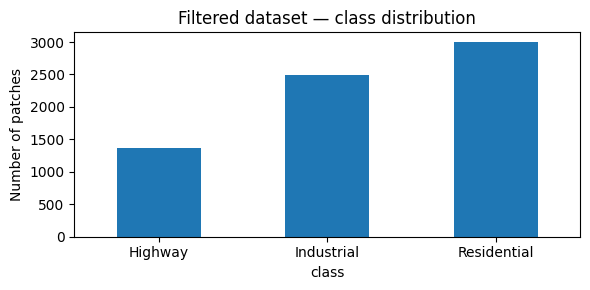

In [7]:
# ============================================================
# FILTERED DATAFRAME — TARGET CLASSES & BUILT-UP CONSTRAINT
#   + CAPPING on ghsl_built and all numeric tabular features
# ============================================================

# ------------------------------------------------------------
# 1. Load the full EuroSAT + GHSL dataset (complete)
# ------------------------------------------------------------
# The CSV contains the complete EuroSAT dataset enriched with
# geospatial metadata (lat/lon) and GHSL built-up values.
csv_path = "/content/eurosat_with_ghsl.csv"
df_complete = pd.read_csv(csv_path)

# ------------------------------------------------------------
# 2. Select target land-use classes
# ------------------------------------------------------------
# We focus on three physically meaningful land-use classes
# representing different types of human infrastructure.
target_classes = ["Residential", "Industrial", "Highway"]

# ------------------------------------------------------------
# 3. Filter samples based on GHSL built-up information
# ------------------------------------------------------------
# We retain only samples that:
#  - have a valid GHSL built-up value,
#  - show strictly positive built-up presence,
#  - belong to one of the selected target classes.
df = df_complete[
    df_complete["ghsl_built"].notna() &
    (df_complete["ghsl_built"] > 0) &
    df_complete["class"].isin(target_classes)
].reset_index(drop=True)

print("Filtered dataset shape:", df.shape)
display(df.head(5))

# ------------------------------------------------------------
# 4. Capping (winsorization) on ALL numeric columns
# ------------------------------------------------------------
# Extreme values are capped to reduce the influence of outliers
# on downstream models. This applies to ghsl_built and to any
# numeric tabular feature (bands, indices, textures) once added.
#
# Geographic coordinates (lon, lat) are explicitly excluded.
def cap_numeric_columns(df_in, lower_q=0.01, upper_q=0.99, exclude=("lon", "lat")):
    df_out = df_in.copy()
    num_cols = df_out.select_dtypes(include=[np.number]).columns.tolist()
    num_cols = [c for c in num_cols if c not in exclude]

    bounds = {}
    for c in num_cols:
        lo = df_out[c].quantile(lower_q)
        hi = df_out[c].quantile(upper_q)
        df_out[c] = df_out[c].clip(lo, hi)
        bounds[c] = (float(lo), float(hi))

    return df_out, bounds

df, cap_bounds = cap_numeric_columns(df, lower_q=0.01, upper_q=0.99, exclude=("lon", "lat"))

print("\nCapping applied to numeric columns (excluding lon/lat).")
print("Capping bounds for ghsl_built:", cap_bounds.get("ghsl_built", None))

# ------------------------------------------------------------
# 5. Class counts after filtering (explicit numbers)
# ------------------------------------------------------------
# Reporting absolute counts per class is important to:
#  - assess class imbalance,
#  - motivate the choice of evaluation metrics (e.g., macro-F1).
class_counts = df["class"].value_counts().sort_index()

print("\nNumber of samples per class:")
display(class_counts.to_frame(name="n_patches"))

for cls, n in class_counts.items():
    print(f"  - {cls}: {n:,} samples")

# ------------------------------------------------------------
# 6. Class distribution plot (visual summary)
# ------------------------------------------------------------
plt.figure(figsize=(6,3))
class_counts.plot(kind="bar")
plt.title("Filtered dataset — class distribution")
plt.ylabel("Number of patches")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

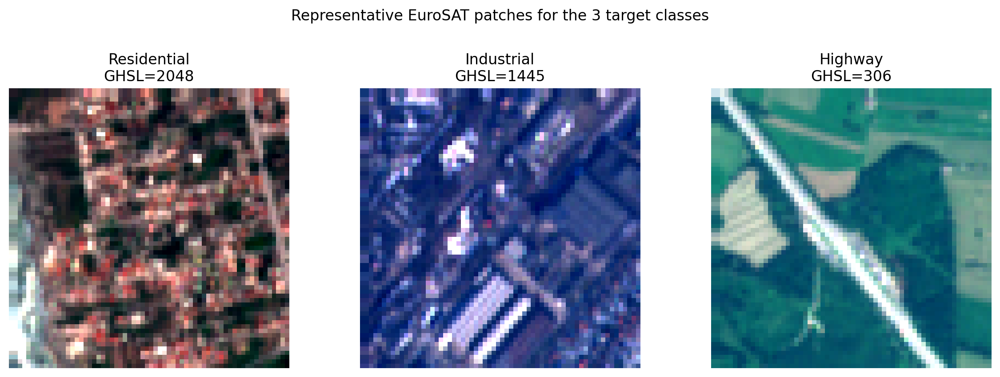

In [8]:
# ============================================================
# QUALITATIVE CHECK — 3 representative image patches (one per class)
#   Robust selection (no pandas deprecation warning)
#   Robust title access (no itertuples naming issues)
# ============================================================

# --- safety checks ---
assert "filepath" in df.columns, "df must contain a 'filepath' column."
assert "class" in df.columns, "df must contain a 'class' column."
assert "ghsl_built" in df.columns, "df must contain 'ghsl_built'."

# --- pick 1 deterministic sample per class (no groupby-apply) ---
samples = []
for cls in target_classes:
    sub = df[df["class"] == cls]
    assert len(sub) > 0, f"No samples found for class={cls}"
    samples.append(sub.sample(1, random_state=42))

samples = pd.concat(samples, ignore_index=True)

def read_patch_rgb(path):
    """
    Read a multi-band GeoTIFF and render as RGB for visualization.
    Tries Sentinel-2 RGB (B4,B3,B2) if available; otherwise falls back to first 3 bands.
    Applies a robust 2–98% stretch to avoid washed-out images.
    """
    with rasterio.open(path) as src:
        arr = src.read()  # (bands, H, W)

    if arr.shape[0] == 3:
        rgb = np.transpose(arr, (1, 2, 0))
    else:
        # Try (B4,B3,B2) = (4,3,2) in 1-based -> (3,2,1) in 0-based
        idx = [3, 2, 1]
        if max(idx) < arr.shape[0]:
            rgb = np.stack([arr[idx[0]], arr[idx[1]], arr[idx[2]]], axis=-1)
        else:
            rgb = np.transpose(arr[:3, :, :], (1, 2, 0))

    rgb = rgb.astype(np.float32)
    lo = np.nanpercentile(rgb, 2)
    hi = np.nanpercentile(rgb, 98)
    rgb = np.clip((rgb - lo) / (hi - lo + 1e-8), 0, 1)
    return rgb

fig, axes = plt.subplots(1, 3, figsize=(12, 4), dpi=200)

for ax, (_, r) in zip(axes, samples.iterrows()):
    img = read_patch_rgb(r["filepath"])
    ax.imshow(img)
    ax.set_title(f"{r['class']}\nGHSL={r['ghsl_built']:.0f}")
    ax.axis("off")

plt.suptitle("Representative EuroSAT patches for the 3 target classes", y=1.05)
plt.tight_layout()
plt.show()

### Global distribution of GHSL built-up intensity

The distribution of GHSL values in the filtered dataset exhibits a broad range and a pronounced right skew.
Built-up intensity spans several orders of magnitude, with no evident multimodal structure or natural discretization into a small number of bins.

This observation has two important implications:
- GHSL should be treated as a continuous target variable rather than as a categorical label,
- simple threshold-based or class-based prediction strategies are unlikely to capture the fine-grained variability present in the data.

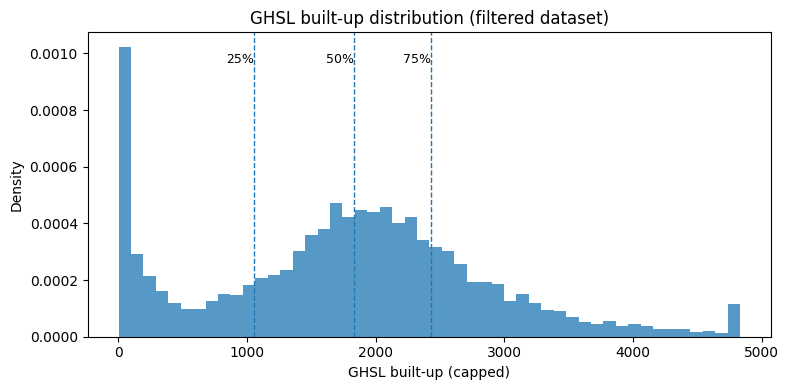

GHSL summary statistics (filtered):


,ghsl_built
count,6857.000000
mean,1771.701870
std,1085.118213
min,2.000000
25%,1054.000000
50%,1830.000000
75%,2431.000000
max,4833.880000


In [9]:
# ============================================================
# GHSL EDA — Global distribution (filtered dataset)
# ============================================================

ghsl_vals = df["ghsl_built"].values

plt.figure(figsize=(8,4))

plt.hist(
    ghsl_vals,
    bins=50,
    density=True,
    alpha=0.75
)

plt.title("GHSL built-up distribution (filtered dataset)")
plt.xlabel("GHSL built-up (capped)")
plt.ylabel("Density")

# Mark key quantiles (useful for interpretation)
for q in [0.25, 0.5, 0.75]:
    v = np.quantile(ghsl_vals, q)
    plt.axvline(v, linestyle="--", linewidth=1)
    plt.text(v, plt.ylim()[1]*0.9, f"{int(q*100)}%", ha="right", fontsize=9)

plt.tight_layout()
plt.show()

print("GHSL summary statistics (filtered):")
display(df["ghsl_built"].describe())

### Class-conditioned GHSL distributions and overlap analysis

To assess whether coarse land-use semantics are sufficient to explain built-up intensity, we analyze the GHSL distribution conditioned on land-use class.

Boxplots and violin plots reveal that the median GHSL value differs across classes, indicating that land-use categories are informative at a coarse level.
However, all classes exhibit substantial within-class variability and extended tails.

To further investigate distributional overlap, we employ:
- empirical cumulative distribution functions (ECDFs),
- kernel density estimates (KDEs).

These representations show that, despite shifts in central tendency, the support of the GHSL distributions strongly overlaps across classes.
Identical or very similar GHSL values can plausibly correspond to different land-use categories.

Although the GHSL distributions differ across land-use classes, substantial within-class variability and strong inter-class overlap remain.
This indicates that coarse semantic labels alone are insufficient to uniquely determine built-up intensity.

Samples per class:
  - Residential: 2,999
  - Industrial: 2,498
  - Highway: 1,360


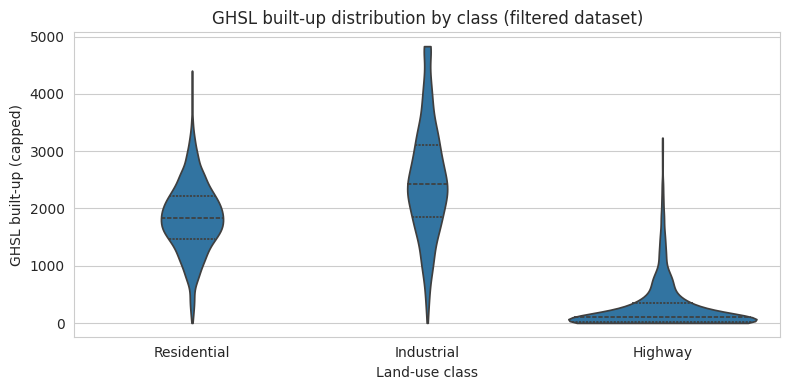

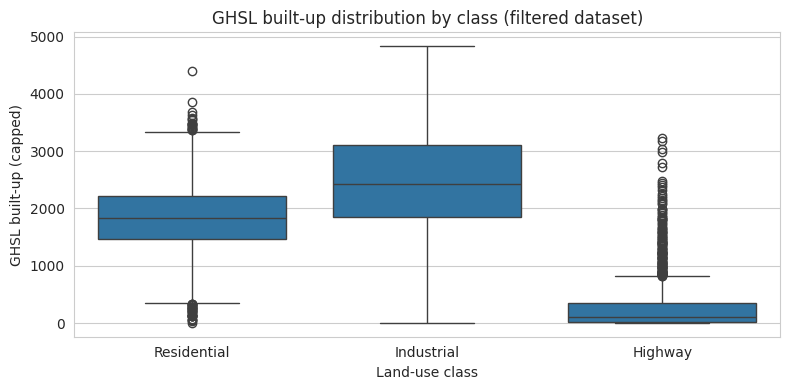

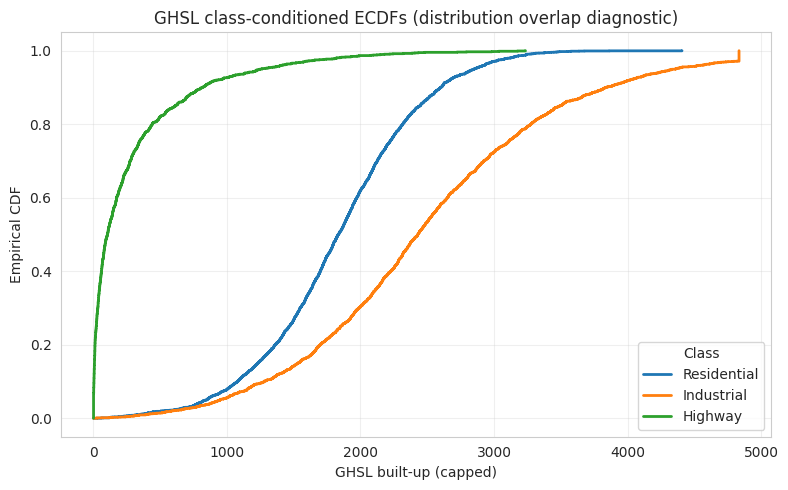

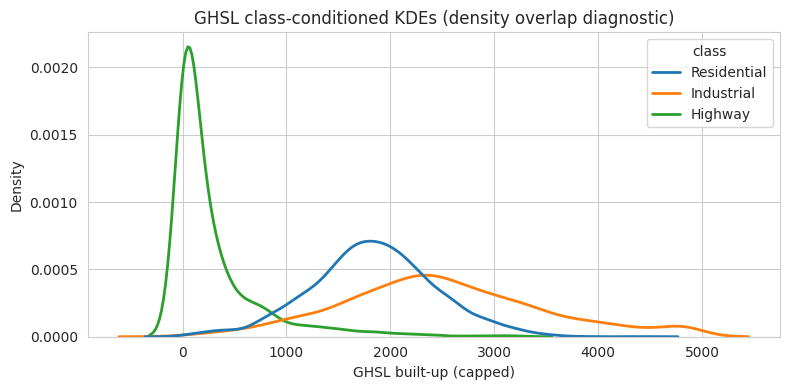

In [10]:
# ============================================================
# GHSL EDA — Class-conditioned distributions + overlap diagnostics
#   (Violin + Box + ECDF + KDE)
# ============================================================

# --- Reproducible style (clean, paper-friendly) ---
sns.set_style("whitegrid")

# --- Fixed, interpretable class order (keep consistent across plots) ---
class_order = ["Residential", "Industrial", "Highway"]

# --- Basic checks (avoid silent issues) ---
assert "ghsl_built" in df.columns and "class" in df.columns, "df must contain 'ghsl_built' and 'class'."
counts = df["class"].value_counts()
print("Samples per class:")
for c in class_order:
    print(f"  - {c}: {int(counts.get(c, 0)):,}")

# ============================================================
# 1) Violin plot (shape + quartiles) — by class
# ============================================================
plt.figure(figsize=(8,4))
sns.violinplot(
    data=df,
    x="class",
    y="ghsl_built",
    order=class_order,
    inner="quartile",
    cut=0
)
plt.title("GHSL built-up distribution by class (filtered dataset)")
plt.xlabel("Land-use class")
plt.ylabel("GHSL built-up (capped)")
plt.tight_layout()
plt.show()

# ============================================================
# 2) Boxplot — by class
# ============================================================
plt.figure(figsize=(8,4))
sns.boxplot(
    data=df,
    x="class",
    y="ghsl_built",
    order=class_order,
    showfliers=True
)
plt.title("GHSL built-up distribution by class (filtered dataset)")
plt.xlabel("Land-use class")
plt.ylabel("GHSL built-up (capped)")
plt.tight_layout()
plt.show()

# ============================================================
# 3) ECDF (empirical CDF) — overlap diagnostic
#    Interpretation: for each x, ECDF(x) = fraction of samples <= x
# ============================================================
plt.figure(figsize=(8,5))

for cls in class_order:
    vals = np.sort(df.loc[df["class"] == cls, "ghsl_built"].values)
    if len(vals) == 0:
        continue
    ecdf = np.arange(1, len(vals) + 1) / len(vals)
    plt.step(vals, ecdf, where="post", linewidth=2, label=cls)

plt.xlabel("GHSL built-up (capped)")
plt.ylabel("Empirical CDF")
plt.title("GHSL class-conditioned ECDFs (distribution overlap diagnostic)")
plt.legend(title="Class")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# 4) KDE (smoothed density) — overlap diagnostic
#    Note: KDE depends on bandwidth; use ECDF for a bin-free view.
# ============================================================
plt.figure(figsize=(8,4))
sns.kdeplot(
    data=df,
    x="ghsl_built",
    hue="class",
    hue_order=class_order,
    common_norm=False,
    fill=False,
    linewidth=2
)
plt.xlabel("GHSL built-up (capped)")
plt.ylabel("Density")
plt.title("GHSL class-conditioned KDEs (density overlap diagnostic)")
plt.tight_layout()
plt.show()

### Geospatial EDA: where does built-up intensity vary across Europe?

We analyze the spatial organization of the GHSL built-up target over Europe using the filtered dataset.
This step is important for two reasons:

1. **Large-scale structure:** Built-up intensity is not uniformly distributed in space.
2. **Local variability:** Even within the same region, the built-up intensity can vary substantially. This motivates models that rely on **local visual patterns** rather than location alone.

In [13]:
# ============================================================
# GHSL GEO-EDA — Setup (GeoDataFrame + Europe view bounds)
# ============================================================

# GeoDataFrame from filtered df
gdf_ghsl = gpd.GeoDataFrame(
    df.copy(),
    geometry=gpd.points_from_xy(df["lon"], df["lat"]),
    crs="EPSG:4326"
)

# Natural Earth boundaries (lightweight + reliable URL)
NE_URL = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(NE_URL).to_crs("EPSG:4326")

# Europe-focused bounds (data-driven) with padding
minx, miny, maxx, maxy = gdf_ghsl.total_bounds
padx = (maxx - minx) * 0.06
pady = (maxy - miny) * 0.08
EU_BOUNDS = (minx - padx, miny - pady, maxx + padx, maxy + pady)

# Consistent color scaling across ALL geo-plots (robust to outliers)
vmin = float(df["ghsl_built"].quantile(0.01))
vmax = float(df["ghsl_built"].quantile(0.99))
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

print("Europe view bounds (lon/lat):", EU_BOUNDS)
print("N points:", len(gdf_ghsl))
print("Color scale (1–99%):", (vmin, vmax))

Europe view bounds (lon/lat): (np.float64(-18.37484726591998), np.float64(25.003794174770228), np.float64(36.33006304499772), np.float64(68.02442992457911))
N points: 6857
Color scale (1–99%): (2.0, 4833.387199999999)


The map shows the **spatial distribution of GHSL built-up intensity** over Europe, where each point corresponds to a single EuroSAT image patch and is colored according to its associated GHSL value.

Several clear patterns emerge from this visualization. High built-up values are predominantly concentrated in well-known urbanized regions of central and western Europe, including the Benelux area, Germany, northern Italy and parts of the United Kingdom. Lower built-up values are more frequently observed in peripheral, rural or less densely populated regions, such as parts of southern Europe, eastern Europe and Scandinavia.

At the same time, the map highlights substantial **local heterogeneity**: within the same geographic regions, neighboring patches often display markedly different GHSL values. This is particularly visible around major metropolitan areas, where clusters of high-intensity points coexist with nearby low-intensity ones.

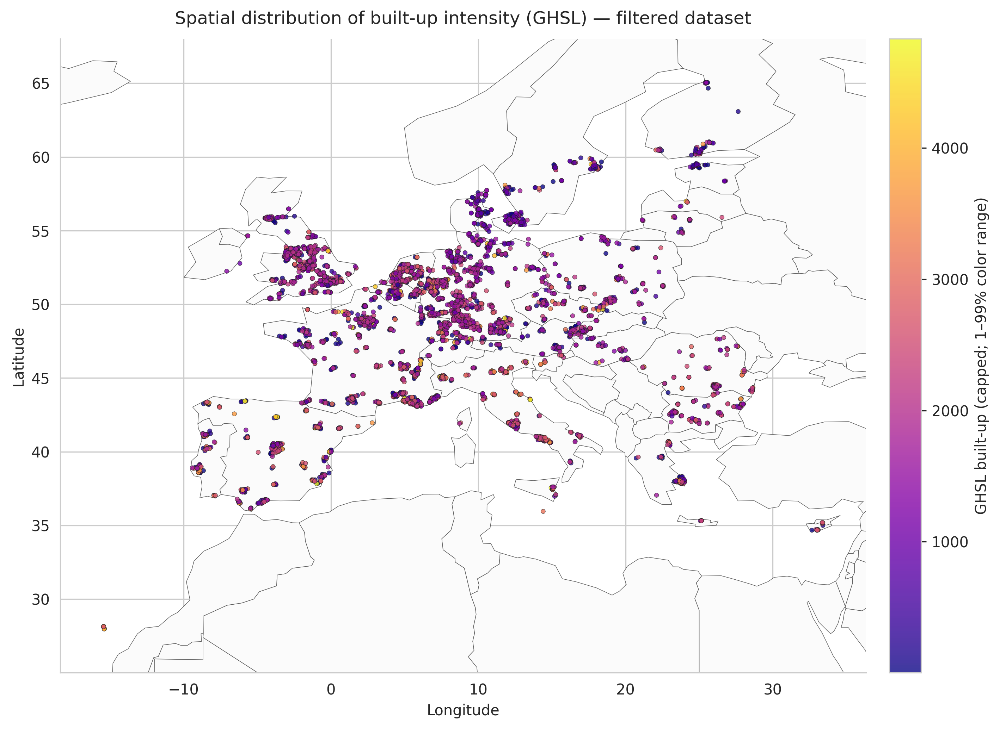

Saved: /content/ghsl_map_europe_scatter.png


In [14]:
# ============================================================
# GHSL GEO-EDA — Enhanced scatter (Europe-only) + SAVE PNG
# ============================================================

xmin, ymin, xmax, ymax = EU_BOUNDS

fig, ax = plt.subplots(figsize=(12, 7), dpi=300)

# Background
world.plot(ax=ax, facecolor="#fbfbfb", edgecolor="#5c5c5c", linewidth=0.35)

# Point-level scatter
sc = ax.scatter(
    df["lon"].values,
    df["lat"].values,
    c=df["ghsl_built"].values,
    s=9,
    alpha=0.80,
    cmap="plasma",
    norm=norm,
    linewidths=0.25,
    edgecolors="#1f1f1f"
)

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

ax.set_title("Spatial distribution of built-up intensity (GHSL) — filtered dataset", pad=10)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

cbar = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("GHSL built-up (capped; 1–99% color range)")

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

# --- SAVE (PNG only) ---
out_png_scatter = "/content/ghsl_map_europe_scatter.png"
fig.savefig(out_png_scatter, dpi=600, bbox_inches="tight")
print("Saved:", out_png_scatter)

A point-level map can become visually noisy when many samples overlap.
To highlight **large-scale spatial trends** while retaining robustness to outliers, we aggregate samples into a regular hexagonal grid:

- each hexagon collects all samples whose (lon, lat) fall inside the cell;
- we compute the **median** GHSL within each cell and color the cell accordingly.

We choose the **median** (instead of the mean) because GHSL values are heavy-tailed and can contain extreme values:
the median provides a stable “typical” built-up intensity for that area, without being dominated by a few high-intensity patches.

Importantly, this aggregation is used **only for visualization**: the learning task remains defined at the original patch level.

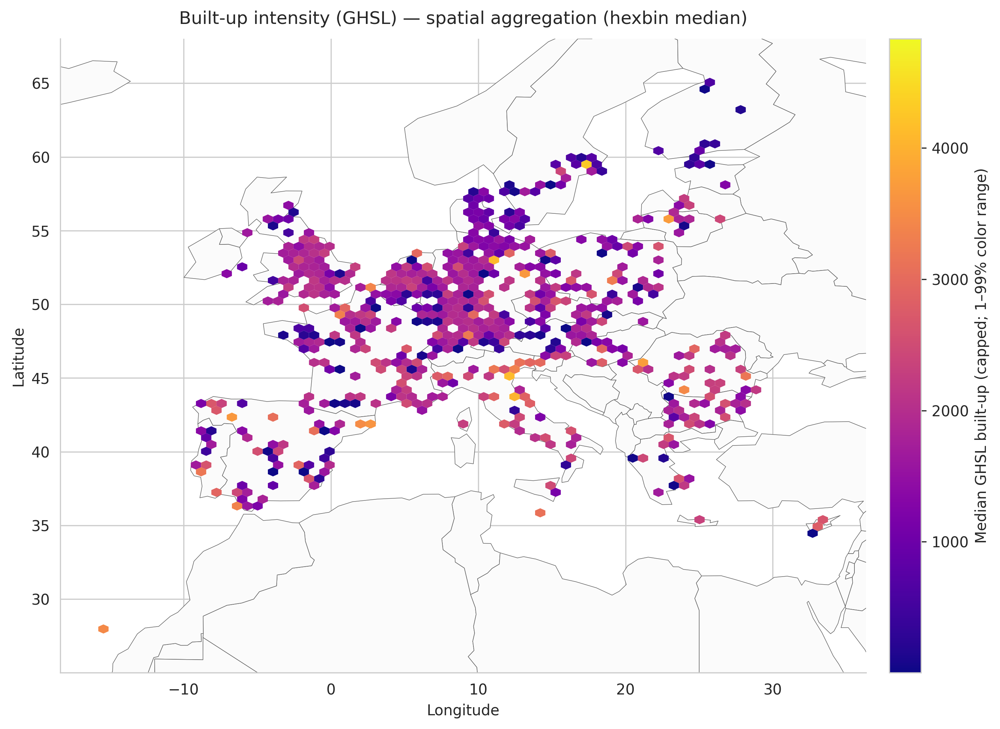

Saved: /content/ghsl_map_europe_hexbin_median.png


In [15]:
# ============================================================
# GHSL GEO-EDA — Hexbin map (Europe-only) + SAVE PNG
#   Color = median GHSL per hex cell (robust spatial summary)
# ============================================================

fig, ax = plt.subplots(figsize=(12, 7), dpi=300)

# Background
world.plot(ax=ax, facecolor="#fbfbfb", edgecolor="#5c5c5c", linewidth=0.35)

hb = ax.hexbin(
    df["lon"].values,
    df["lat"].values,
    C=df["ghsl_built"].values,
    reduce_C_function=np.median,
    gridsize=70,        # adjust (e.g., 80–100) for finer/coarser aggregation
    cmap="plasma",
    norm=norm,
    mincnt=1,
    linewidths=0.0
)

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

ax.set_title("Built-up intensity (GHSL) — spatial aggregation (hexbin median)", pad=10)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

cbar = fig.colorbar(hb, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("Median GHSL built-up (capped; 1–99% color range)")

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

# --- SAVE (PNG only) ---
out_png_hexbin = "/content/ghsl_map_europe_hexbin_median.png"
fig.savefig(out_png_hexbin, dpi=600, bbox_inches="tight")
print("Saved:", out_png_hexbin)

The two scatter plots show GHSL built-up intensity as a function of longitude (left) and latitude (right), with each point representing a single EuroSAT image patch.

GHSL values exhibit substantial variability across both geographic coordinates, with low and high built-up intensities occurring throughout the spatial domain. Although higher GHSL values are more frequently observed within specific geographic ranges, no simple or deterministic relationship with latitude or longitude emerges from the data.



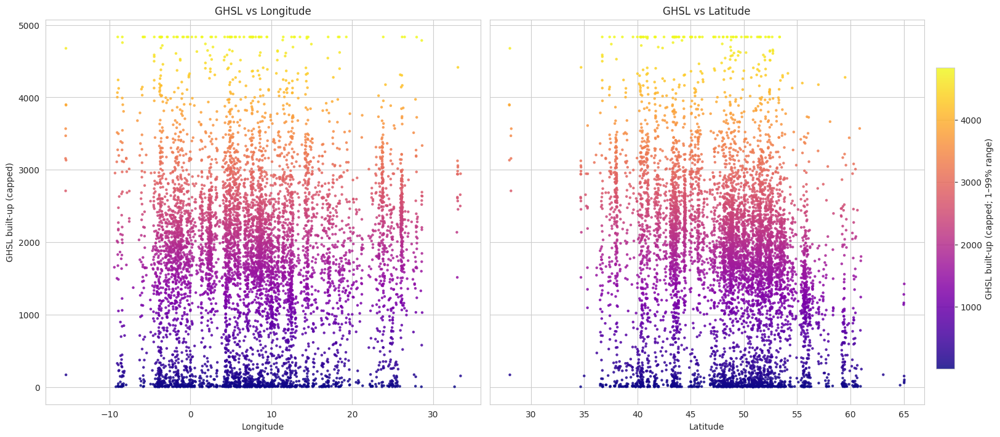

Saved: /content/ghsl_lat_lon_trends.png


In [16]:
# ============================================================
# GHSL GEO-EDA — Large-scale geographic trends (lat / lon) + SAVE PNG
#   One shared colorbar on the right
# ============================================================

fig, ax = plt.subplots(1, 2, figsize=(15, 7), sharey=True, constrained_layout=True)

sc0 = ax[0].scatter(
    df["lon"].values, df["ghsl_built"].values,
    c=df["ghsl_built"].values,
    s=10, alpha=0.85,
    cmap="plasma", norm=norm,
    linewidths=0
)
ax[0].set_title("GHSL vs Longitude")
ax[0].set_xlabel("Longitude")
ax[0].set_ylabel("GHSL built-up (capped)")

sc1 = ax[1].scatter(
    df["lat"].values, df["ghsl_built"].values,
    c=df["ghsl_built"].values,
    s=10, alpha=0.85,
    cmap="plasma", norm=norm,
    linewidths=0
)
ax[1].set_title("GHSL vs Latitude")
ax[1].set_xlabel("Latitude")

# Colorbar axis to the right of both plots
cax = fig.add_axes([1.01, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc1, cax=cax)
cbar.set_label("GHSL built-up (capped; 1–99% range)")

plt.show()

# --- SAVE (PNG only) ---
out_png_latlon = "/content/ghsl_lat_lon_trends.png"
fig.savefig(out_png_latlon, dpi=600, bbox_inches="tight")
print("Saved:", out_png_latlon)

The violin and boxplots summarize the distribution of GHSL built-up values for countries with a sufficiently large number of samples (n $\geq$ 100).

Across countries, the distributions differ in their central tendency and spread: some countries exhibit higher median built-up intensity, while others show lower typical values or broader variability. However, for all countries, the distributions remain wide, with substantial overlap in both interquartile ranges and overall value ranges.

This indicates that, while country-level effects influence the typical level of built-up intensity, no country is associated with a narrow or unique GHSL range. High and low built-up values coexist within each country, reflecting strong intra-country heterogeneity.

Overall, the analysis shows that geographic aggregation at the country level captures large-scale differences in built-up intensity, but does not lead to a clear separation of GHSL values across countries.

Country column added. Unique countries: 29
Top countries:


,count
country,
Germany,1457
France,1217
United Kingdom,782
Spain,522
Italy,467
Netherlands,327
Romania,251
Denmark,235
Poland,198


Countries kept (n >= 100): 14
Total samples kept: 6,195


/tmp/ipython-input-1689483944.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


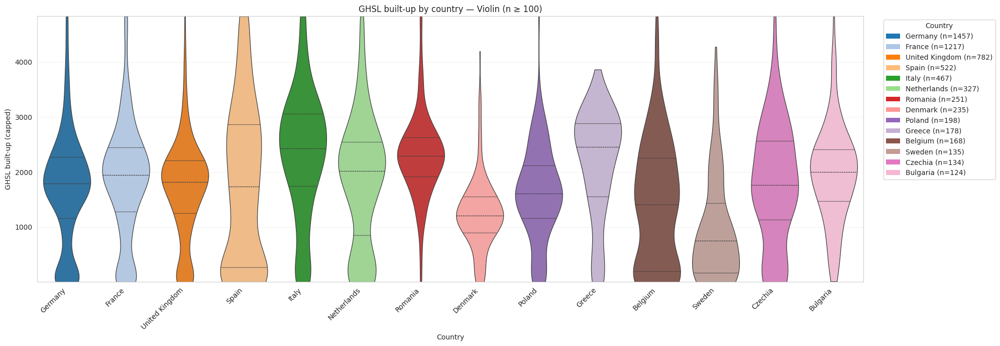

/tmp/ipython-input-1689483944.py:108: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


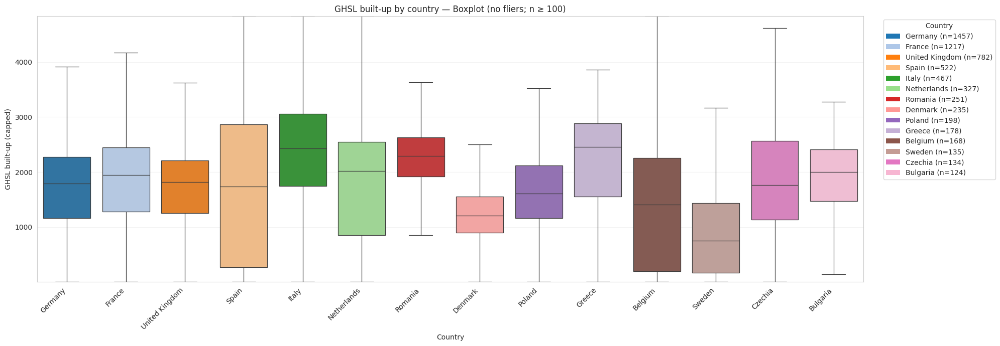

In [19]:
# ============================================================
# GHSL EDA by COUNTRY (filtered dataset)
#   1) add 'country' via spatial join (robust to column names)
#   2) keep countries with enough samples
#   3) Violin + Boxplot (VERTICAL) with per-country colors + legend
# ============================================================

# -----------------------------
# A) Add 'country' column via Natural Earth spatial join
# -----------------------------
NE_URL = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world_admin = gpd.read_file(NE_URL)[["ADMIN", "geometry"]].to_crs("EPSG:4326")

gdf = gpd.GeoDataFrame(
    df.copy(),
    geometry=gpd.points_from_xy(df["lon"], df["lat"]),
    crs="EPSG:4326"
)

joined = gpd.sjoin(gdf, world_admin, how="left", predicate="intersects")

# Robustly recover the country name column from the join output
# (Depending on versions, it may be 'ADMIN', or suffixed.)
country_col = None
for c in ["country", "ADMIN", "country_right", "ADMIN_right", "country_left", "ADMIN_left"]:
    if c in joined.columns:
        country_col = c
        break
if country_col is None:
    # Fallback: try to find anything that contains 'ADMIN' (very defensive)
    admin_like = [c for c in joined.columns if "ADMIN" in c.upper()]
    if admin_like:
        country_col = admin_like[0]

assert country_col is not None, f"Could not find a country column in joined. Columns: {list(joined.columns)}"

df = df.copy()
df["country"] = joined[country_col].fillna("Unknown").astype(str).values

print("Country column added. Unique countries:", df["country"].nunique())
print("Top countries:")
display(df["country"].value_counts().head(10))

# -----------------------------
# B) Keep only countries with enough samples
# -----------------------------
MIN_SAMPLES_PER_COUNTRY = 100   # tune
EXCLUDE_UNKNOWN = True

counts = df["country"].value_counts()
kept = counts[counts >= MIN_SAMPLES_PER_COUNTRY].index.tolist()
if EXCLUDE_UNKNOWN and "Unknown" in kept:
    kept.remove("Unknown")

df_ctry = df[df["country"].isin(kept)].copy()

# Order countries by frequency (left-to-right)
order = df_ctry["country"].value_counts().index.tolist()
df_ctry["country"] = pd.Categorical(df_ctry["country"], categories=order, ordered=True)

print(f"Countries kept (n >= {MIN_SAMPLES_PER_COUNTRY}): {len(order)}")
print("Total samples kept:", f"{len(df_ctry):,}")

# Robust y-range (consistent across plots)
vmin = float(df_ctry["ghsl_built"].quantile(0.01))
vmax = float(df_ctry["ghsl_built"].quantile(0.99))

# -----------------------------
# C) Palette (one distinct color per country) + legend handles
# -----------------------------
palette_list = sns.color_palette("tab20", n_colors=len(order))
country_palette = {c: palette_list[i] for i, c in enumerate(order)}

legend_handles = [
    Patch(facecolor=country_palette[c], edgecolor="none", label=f"{c} (n={int(counts[c])})")
    for c in order
]

# -----------------------------
# D) Violin plot (VERTICAL)
# -----------------------------
plt.figure(figsize=(20, 7))
ax = sns.violinplot(
    data=df_ctry,
    x="country",
    y="ghsl_built",
    order=order,
    palette=country_palette,
    inner="quartile",
    cut=0,
    linewidth=0.9
)
ax.set_ylim(vmin, vmax)
ax.set_title(f"GHSL built-up by country — Violin (n ≥ {MIN_SAMPLES_PER_COUNTRY})")
ax.set_xlabel("Country")
ax.set_ylabel("GHSL built-up (capped)")
ax.grid(axis="y", alpha=0.25)
ax.legend(handles=legend_handles, title="Country", bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

# -----------------------------
# E) Boxplot (VERTICAL, no fliers)
# -----------------------------
plt.figure(figsize=(20, 7))
ax = sns.boxplot(
    data=df_ctry,
    x="country",
    y="ghsl_built",
    order=order,
    palette=country_palette,
    showfliers=False,   # <-- no fliers
    linewidth=0.9
)
ax.set_ylim(vmin, vmax)
ax.set_title(f"GHSL built-up by country — Boxplot (no fliers; n ≥ {MIN_SAMPLES_PER_COUNTRY})")
ax.set_xlabel("Country")
ax.set_ylabel("GHSL built-up (capped)")
ax.grid(axis="y", alpha=0.25)
ax.legend(handles=legend_handles, title="Country", bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

### Spectral predictors

Each EuroSAT sample corresponds to a small satellite image patch acquired by the Sentinel-2 sensor.
For each patch, the sensor records a set of spectral band values, which can be thought of as numbers measuring how much light the surface reflects at different wavelengths.
Some bands capture information related to visible light, others to near-infrared or short-wave infrared and each band responds differently to surface characteristics such as vegetation, soil, built structures or moisture.

In practical terms, the spectral bands are the raw numerical descriptors available for each image patch.
They do not describe objects or shapes, but rather provide low-level physical measurements of the surface, and therefore represent the most basic predictors that can be used to estimate built-up intensity.

We begin by analyzing the distributions of the individual bands to understand their scale, variability and shape.
Density plots are shown using the original (clipped) band values to preserve their physical meaning, while boxplots are computed on normalized values to allow direct comparison across bands with very different numeric ranges.

Next, we investigate how these spectral bands relate to the GHSL built-up target by examining both linear and monotonic associations, as well as non-linear dependencies.
This allows us to assess whether changes in band values are systematically associated with changes in built-up intensity or whether the relationship is weak and highly variable.

Finally, we apply non-linear regression models using the spectral bands, geographic coordinates and coarse land-use information to quantify how much of the variability in GHSL can be explained using these tabular predictors alone.
This step provides a quantitative baseline on the predictive power of raw spectral information and clarifies whether a more expressive representation is required to capture the complex structure underlying the GHSL target.

In [20]:
# ============================================================
#   Extract band statistics from GeoTIFFs and append to df
#   - Reads EuroSAT multi-spectral GeoTIFFs (13 Sentinel-2 bands)
#   - Computes per-patch band features (mean by default)
#   - Outputs df with columns: band_1 ... band_13 (plus existing ghsl_built, lat, lon, class, etc.)
# ============================================================

assert "filepath" in df.columns, "df must contain a 'filepath' column with .tif paths."

# ---- choose which statistic to extract per band ----
# You can switch to np.median, or add more stats later (p10/p90/std, etc.)
STAT_FN = np.mean  # np.mean or np.median

# ---- infer number of bands from the first file (EuroSAT all-bands should be 13) ----
with rasterio.open(df["filepath"].iloc[0]) as src:
    n_bands = src.count

print("Detected n_bands:", n_bands)

# ---- storage ----
band_features = np.zeros((len(df), n_bands), dtype=np.float32)

# ---- loop over patches ----
for i, fp in enumerate(tqdm(df["filepath"].tolist(), desc="Extracting bands")):
    with rasterio.open(fp) as src:
        # read all bands: shape (n_bands, H, W)
        arr = src.read().astype(np.float32)

        # compute per-band statistic over pixels
        # result shape: (n_bands,)
        band_features[i, :] = STAT_FN(arr.reshape(n_bands, -1), axis=1)

# ---- attach to df ----
band_cols = [f"band_{k}" for k in range(1, n_bands + 1)]
df_bands = pd.DataFrame(band_features, columns=band_cols)

# Keep df clean: remove any pre-existing band_* to avoid duplicates
df = df.drop(columns=[c for c in df.columns if c.startswith("band_")], errors="ignore").reset_index(drop=True)
df = pd.concat([df.reset_index(drop=True), df_bands], axis=1)

print("Done. df shape:", df.shape)
print("Added columns:", band_cols)
display(df[["filepath", "class", "ghsl_built"] + band_cols].head(3))

Detected n_bands: 13


Extracting bands: 100%|██████████| 6857/6857 [00:47<00:00, 144.55it/s]


Done. df shape: (6857, 22)
Added columns: ['band_1', 'band_2', 'band_3', 'band_4', 'band_5', 'band_6', 'band_7', 'band_8', 'band_9', 'band_10', 'band_11', 'band_12', 'band_13']


,filepath,class,ghsl_built,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,band_11,band_12,band_13
0,/content/eurosat_data/ds/images/remote_sensing...,Highway,253.0,1243.789795,964.940918,891.885498,634.488525,1058.015869,2658.260742,3257.369629,3218.543213,1056.251465,13.074707,1785.845215,874.090576,3669.746582
1,/content/eurosat_data/ds/images/remote_sensing...,Highway,182.0,1065.836914,836.107178,794.229004,585.322510,952.629883,2117.003906,2524.121582,2525.895020,998.508789,11.434570,1574.493652,838.964844,2803.428223
2,/content/eurosat_data/ds/images/remote_sensing...,Highway,173.0,1282.034668,1070.053711,990.806641,932.578857,1142.685791,1890.641846,2249.494873,2151.065186,504.175049,10.296143,1979.584717,1228.778564,2484.833740


The following figure shows the empirical distributions of each spectral band after clipping extreme values (1–99%).  
Several aspects are immediately visible:

- the bands have **very different numeric ranges** and shapes;
- many distributions are **skewed** rather than symmetric;
- some bands concentrate most values in a narrow range, while others are more spread out.

These plots reflect the raw physical measurements and are useful to understand the original scale and variability of each band.

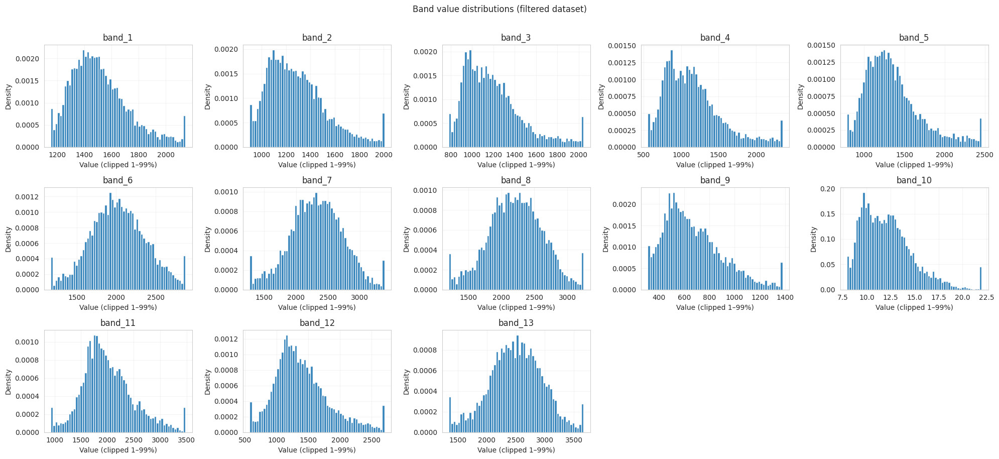

In [21]:
# ============================================================
# BAND DISTRIBUTIONS — Histograms (small multiples)
# ============================================================
BAND_PLOT_QLO, BAND_PLOT_QHI = 0.01, 0.99
n = len(band_cols)
ncols = 5
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(4.0*ncols, 3.0*nrows))
axes = np.array(axes).reshape(-1)

for i, b in enumerate(band_cols):
    x = df[b].dropna().values

    # robust clipping for visualization (does not modify df)
    lo = np.quantile(x, BAND_PLOT_QLO)
    hi = np.quantile(x, BAND_PLOT_QHI)
    x = np.clip(x, lo, hi)

    axes[i].hist(x, bins=60, density=True, alpha=0.9)
    axes[i].set_title(b)
    axes[i].set_xlabel("Value (clipped 1–99%)")
    axes[i].set_ylabel("Density")
    axes[i].grid(alpha=0.2)

# hide empty slots
for j in range(n, len(axes)):
    axes[j].axis("off")

plt.suptitle("Band value distributions (filtered dataset)", y=1.01)
plt.tight_layout()
plt.show()

To make bands directly comparable, we also visualize their **z-scored versions** (zero mean, unit variance).  
This normalization removes scale differences and highlights relative dispersion:

- most bands show comparable interquartile ranges after normalization;
- differences mainly appear in tail behavior and spread rather than central tendency;
- no band collapses to a near-constant signal, confirming that all retain some variability.

Overall, this analysis shows that the spectral bands provide **heterogeneous but informative low-level signals**.  

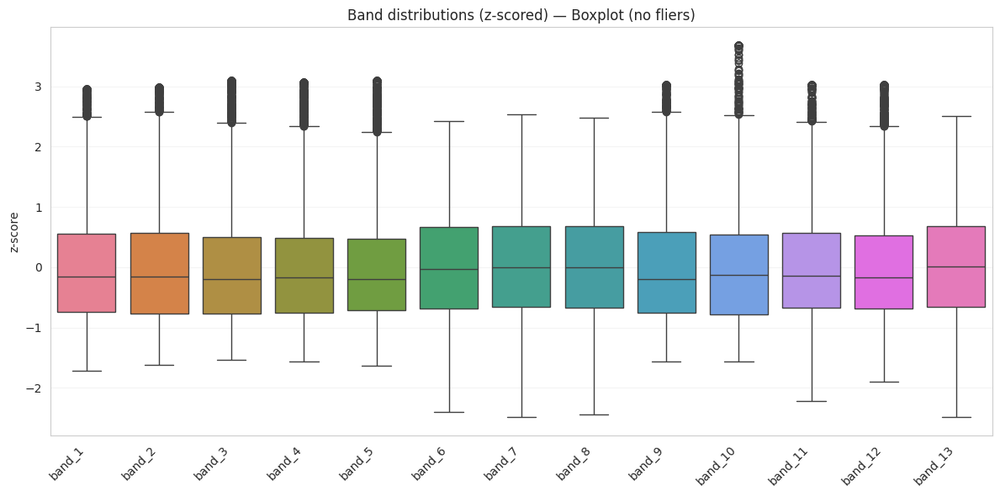

In [22]:
# ============================================================
# BAND BOXPLOTS — Compare scales via z-score normalization
# ============================================================

X = df[band_cols].copy()

# Robust clip for stability in boxplots (visual only)
for b in band_cols:
    lo = X[b].quantile(BAND_PLOT_QLO)
    hi = X[b].quantile(BAND_PLOT_QHI)
    X[b] = X[b].clip(lo, hi)

# z-score to make bands comparable in one plot
Xz = pd.DataFrame(StandardScaler().fit_transform(X), columns=band_cols)

plt.figure(figsize=(max(12, 0.8*len(band_cols)), 6))
sns.boxplot(data=Xz, showfliers=True)
plt.title("Band distributions (z-scored) — Boxplot (no fliers)")
plt.ylabel("z-score")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.show()

The figure below shows **scatter plots between each spectral band and the GHSL built-up target**, with each point representing a single EuroSAT image patch and color encoding the GHSL value.

Across all bands, a **broad vertical spread** of GHSL values is visible for almost every band value. This indicates that similar spectral responses can correspond to very different levels of built-up intensity. While some bands exhibit a **weak monotonic trend**—with higher band values more frequently associated with higher GHSL—the relationship is far from deterministic.

Key observations from the scatter plots are:

- **No single band provides clear separability** between low and high GHSL values.
- The relationship is **heteroscedastic**: variability in GHSL remains high across the full range of band values.
- Patterns appear **non-linear and overlapping**, rather than following a simple linear structure.
- Multiple bands show similar cloud shapes, reflecting strong inter-band correlations.

Overall, these plots suggest that **individual spectral bands carry limited predictive power on their own** for estimating built-up intensity. Any usable signal is weak, noisy, and shared across bands, motivating the need for:
1. combining multiple predictors jointly,
2. using non-linear models to capture interactions
3. and ultimately learning more expressive representations beyond raw spectral values.

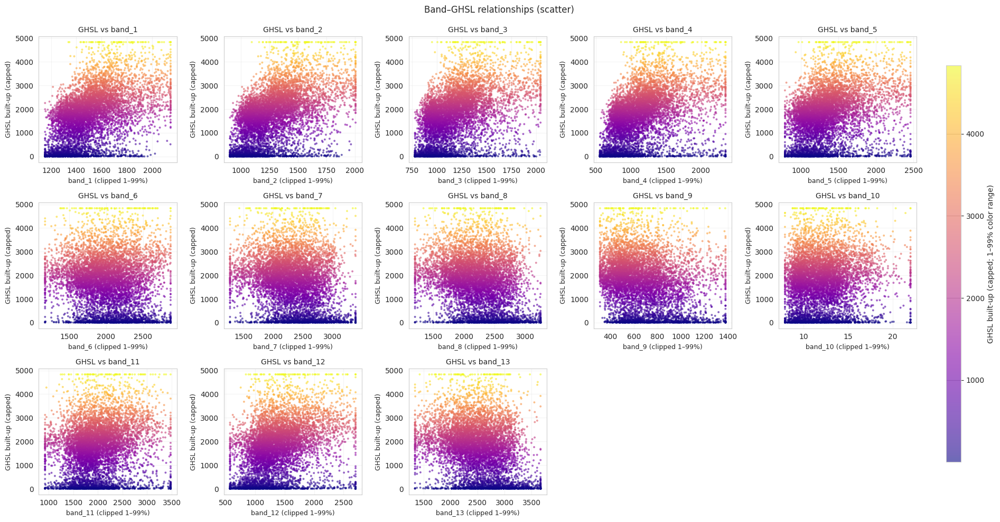

In [23]:
# ============================================================
# GHSL vs BANDS — Scatter (one panel per band)
# ============================================================

assert "ghsl_built" in df.columns, "df must contain 'ghsl_built'."
assert "band_cols" in globals() and len(band_cols) > 0, "band_cols must exist (e.g., ['band_1', ...])."

# Robust GHSL scale for coloring
ghsl_vmin = float(df["ghsl_built"].quantile(0.01))
ghsl_vmax = float(df["ghsl_built"].quantile(0.99))
norm = mpl.colors.Normalize(vmin=ghsl_vmin, vmax=ghsl_vmax)

# Optional robust clipping for x-axis readability
BAND_PLOT_QLO = 0.01
BAND_PLOT_QHI = 0.99

n = len(band_cols)
ncols = 5
nrows = math.ceil(n / ncols)

# Leave room on the right for an external colorbar (rect=[left, bottom, right, top])
fig, axes = plt.subplots(nrows, ncols, figsize=(3.8 * ncols, 3.3 * nrows))
axes = np.array(axes).reshape(-1)

for i, b in enumerate(band_cols):
    x = df[b].astype(float).values
    y = df["ghsl_built"].astype(float).values

    # Clip x to reduce outlier impact on the visual scale
    x_lo = np.nanquantile(x, BAND_PLOT_QLO)
    x_hi = np.nanquantile(x, BAND_PLOT_QHI)
    x_plot = np.clip(x, x_lo, x_hi)

    sc = axes[i].scatter(
        x_plot, y,
        c=y,
        s=8,
        alpha=0.6,
        cmap="plasma",
        norm=norm,
        linewidths=0
    )
    axes[i].set_title(f"GHSL vs {b}", fontsize=10)
    axes[i].set_xlabel(f"{b} (clipped {int(100*BAND_PLOT_QLO)}–{int(100*BAND_PLOT_QHI)}%)", fontsize=9)
    axes[i].set_ylabel("GHSL built-up (capped)", fontsize=9)
    axes[i].grid(alpha=0.2)

# Hide unused panels
for j in range(n, len(axes)):
    axes[j].axis("off")

# Reserve space for the colorbar and suptitle
fig.tight_layout(rect=[0.0, 0.0, 0.93, 0.97])

# External colorbar axis (right of all subplots)
cax = fig.add_axes([0.945, 0.12, 0.015, 0.76])  # [left, bottom, width, height] in figure coords
cbar = fig.colorbar(sc, cax=cax)
cbar.set_label("GHSL built-up (capped; 1–99% color range)")

fig.suptitle("Band–GHSL relationships (scatter)", y=0.995)
plt.show()

The figure below reports two correlation matrices computed across all spectral bands, geographic coordinates (latitude and longitude) and the GHSL built-up target.  
For completeness, we show both **Pearson correlation** (left), which captures linear relationships, and **Spearman correlation** (right), which measures rank-based, monotonic associations.

As discussed in the previous analysis, **no clear linear relationship emerges between any individual spectral band and GHSL**. Consistently, Pearson correlations between single bands and the GHSL target remain moderate at best. These results confirm that built-up intensity cannot be explained by simple linear combinations of raw band values.

For this reason, our interpretation primarily focuses on the **Spearman correlation matrix**, which is more appropriate in this setting because:
- spectral bands and GHSL exhibit non-Gaussian, skewed distributions,
- relationships appear non-linear rather than strictly linear,
- Spearman correlation is more robust to outliers and heavy tails.

From the Spearman matrix, several key patterns emerge:

- **Strong inter-band correlations** are observed across many spectral bands, especially within contiguous wavelength ranges. This reflects the physical redundancy of multi-spectral measurements and explains why many bands convey overlapping information.
- **Correlations between individual bands and GHSL are consistently weak to moderate**, with no band exceeding a strong monotonic association with the target. This reinforces the conclusion that no single spectral channel is sufficient to characterize built-up intensity.
- **Latitude shows a moderate negative correlation with GHSL**, indicating broad continental-scale trends (e.g., higher built-up intensity in mid-latitude regions), while **longitude exhibits negligible correlation**, confirming its limited explanatory role at this scale.
- The gap between strong band–band correlations and weak band–GHSL correlations highlights a key challenge: although spectral information is rich, its relationship with built-up intensity is indirect and highly entangled.


/tmp/ipython-input-1974704497.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.0, 0.0, 0.92, 0.95])


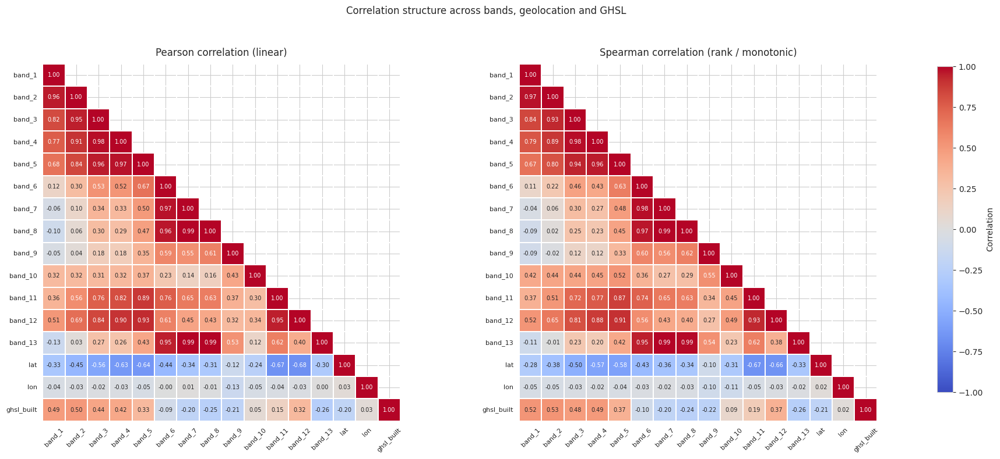

In [24]:
# ============================================================
# CORRELATION MATRICES — Pearson vs Spearman
# ============================================================

# Variables included in the correlation analysis
vars_all = band_cols + ["lat", "lon", "ghsl_built"]

# Use complete cases for correlation (pairwise NaNs can bias readability)
d = df[vars_all].dropna().copy()

corr_pearson  = d.corr(method="pearson")
corr_spearman = d.corr(method="spearman")

def plot_corr_lower(ax, corr, title):
    mask = np.triu(np.ones_like(corr, dtype=bool), k=1)  # mask upper triangle

    sns.heatmap(
        corr,
        mask=mask,
        ax=ax,
        cmap="coolwarm",        # cleaner than vlag; good contrast
        vmin=-1, vmax=1,
        center=0,
        square=True,
        linewidths=0.25,
        linecolor="white",
        annot=True,             # show exact numbers
        fmt=".2f",              # 2 decimals is paper-friendly
        annot_kws={"size": 7},
        cbar=False              # we add a single shared colorbar manually
    )
    ax.set_title(title, pad=10)
    ax.tick_params(axis="x", rotation=45, labelsize=8)
    ax.tick_params(axis="y", rotation=0,  labelsize=8)

# --- Figure with two panels ---
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

plot_corr_lower(axes[0], corr_pearson,  "Pearson correlation (linear)")
plot_corr_lower(axes[1], corr_spearman, "Spearman correlation (rank / monotonic)")

# --- Shared colorbar on the right (outside both plots) ---
mappable = axes[1].collections[0]
cax = fig.add_axes([0.93, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(mappable, cax=cax)
cbar.set_label("Correlation", rotation=90)

fig.suptitle("Correlation structure across bands, geolocation and GHSL", y=0.98)
fig.tight_layout(rect=[0.0, 0.0, 0.92, 0.95])
plt.show()

### Predictor selection strategy for explaining GHSL variability

To quantify how well the GHSL built-up target can be explained by the available tabular predictors, we first define a **relevant subset of features** drawn from the spectral bands and coarse geographic information.  
The goal of this step is *not* to optimize predictive performance, but to build a **clean, interpretable baseline feature space** that allows us to assess the intrinsic explanatory power of raw predictors.

Our selection strategy follows the procedure implemented in the code above and is guided by three complementary principles.

**1. Relevance to GHSL (Spearman correlation)**

We rank all candidate predictors according to the **absolute Spearman correlation** with GHSL.  
Spearman correlation is preferred here because it captures **monotonic relationships** and is robust to:
- non-linear dependencies,
- skewed and heavy-tailed distributions,
- outliers commonly observed in spectral data.

This ranking highlights which predictors show the strongest *direct monotonic association* with built-up intensity, without assuming linearity.

**2. General dependency (Mutual Information)**

In parallel, we compute **Mutual Information (MI)** between each predictor and GHSL.  
Unlike correlation-based measures, MI captures **any form of statistical dependence**, including non-linear and non-monotonic relationships.

Using both Spearman and MI allows us to distinguish between:
- predictors that are weakly correlated but still informative in a non-linear sense,
- predictors that appear correlated only due to linear effects or shared scale.

The two rankings are therefore complementary rather than redundant.

**3. Redundancy and stability filtering**

After ranking, we apply two structural filters to ensure a stable and interpretable feature set:

- **Low-variance removal**: predictors with near-constant values are discarded, as they cannot meaningfully explain variability in GHSL.
- **Redundancy removal**: among pairs of predictors with very high mutual Spearman correlation (|ρ| > 0.9), we keep only the one that is more strongly associated with GHSL.  
  This step reduces multicollinearity while preserving target relevance.

**4. Final selected feature set and correlation structure**

The resulting predictors form a **compact, non-redundant subset** that retains the most informative spectral and geographic signals available at the tabular level.

To verify the structure of this final set, we report the **Spearman correlation matrix (lower triangle)** including GHSL.  
This visualization serves two purposes:
- it confirms that strong inter-feature redundancies have been removed,
- it shows that correlations with GHSL remain **moderate and distributed**, rather than dominated by a single predictor.

Overall, this analysis establishes a principled baseline feature space and clarifies the limits of raw spectral and geographic predictors.  
In the next step, we use this selected set to evaluate how much variance in GHSL can be explained by non-linear regression models and whether more expressive representations are required.


Candidates: ['band_1', 'band_2', 'band_3', 'band_4', 'band_5', 'band_6', 'band_7', 'band_8', 'band_9', 'band_10', 'band_11', 'band_12', 'band_13', 'lat', 'lon']
Samples used: 6,857


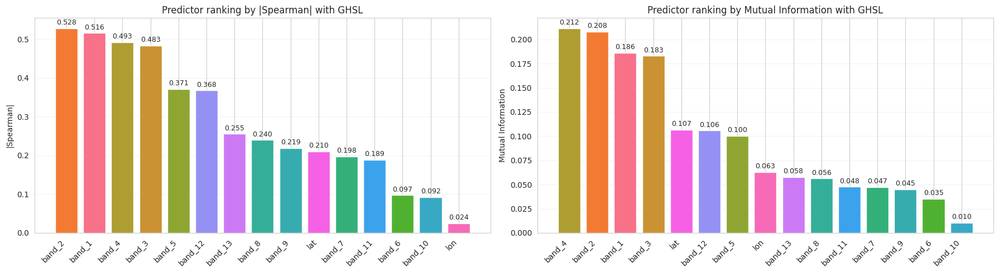


Removed (low variance): None

Dropped (high redundancy, |rho| > 0.90): ['band_1', 'band_11', 'band_12', 'band_3', 'band_5', 'band_6', 'band_7', 'band_8']
Selected features (final): ['band_2', 'band_4', 'band_9', 'band_10', 'band_13', 'lat', 'lon']


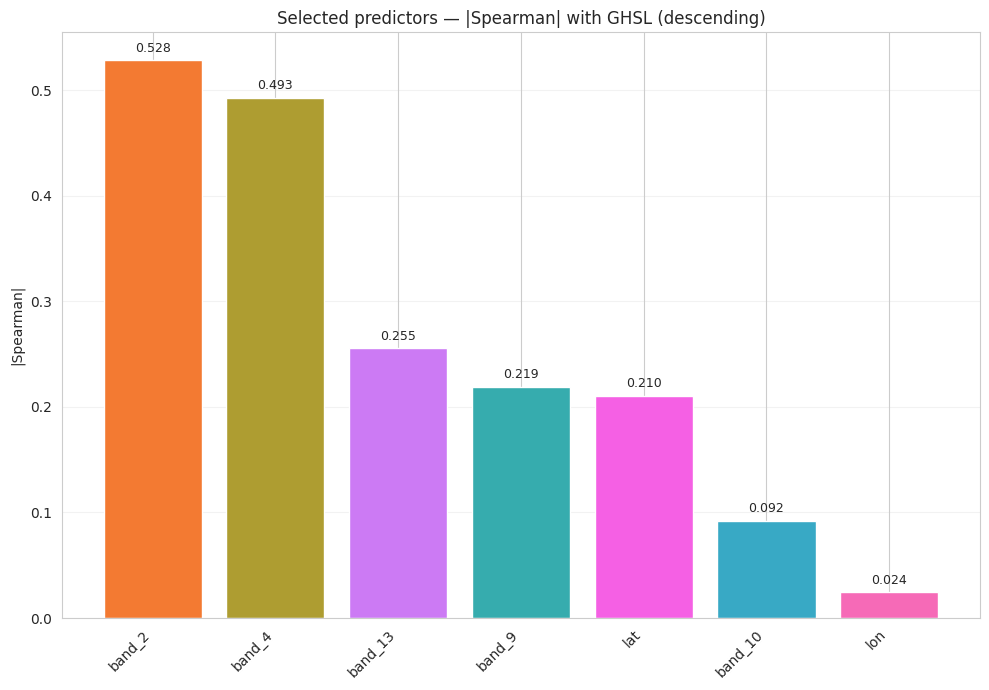

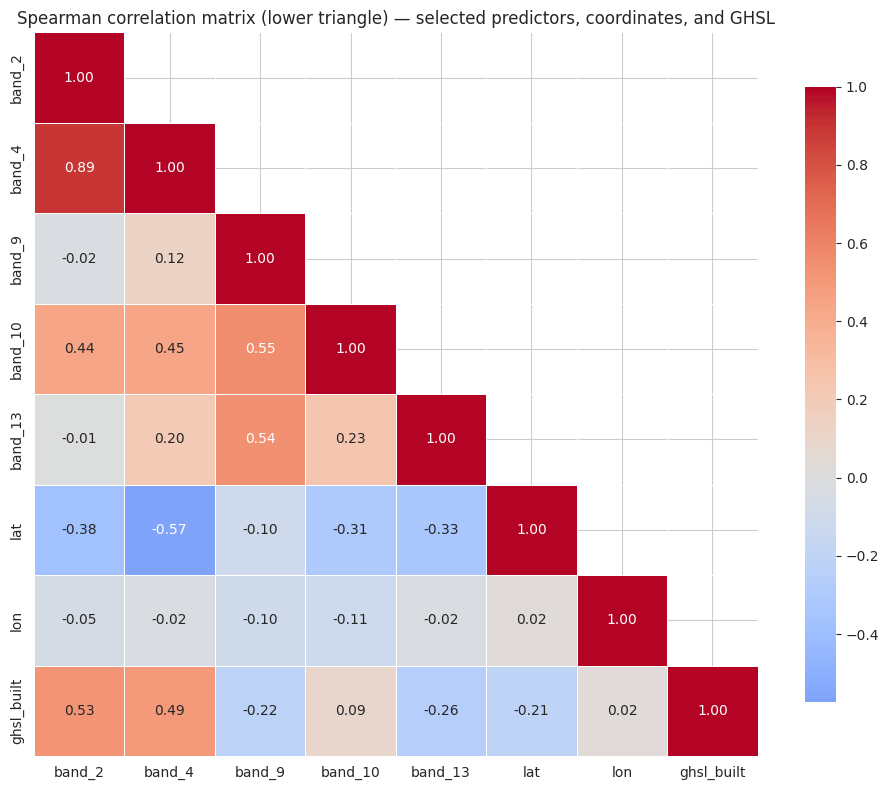

In [25]:
# ============================================================
# FEATURE SELECTION — Candidate predictors
#   1) Rank predictors by |Spearman| w.r.t. GHSL (monotonic association)
#   2) Rank predictors by Mutual Information (non-linear dependency)
#   3) Remove low-variance predictors
#   4) Remove redundant predictors (high feature-feature Spearman corr)
#   5) Visualize rankings as bar charts (one color per feature + numeric labels)
#   6) Show the Spearman correlation matrix (LOWER triangle) of the selected set
# ============================================================

# -----------------------------
# A) Candidate predictors
# -----------------------------
assert "ghsl_built" in df.columns, "df must contain 'ghsl_built'"
assert "band_cols" in globals(), "band_cols must be defined (list of band columns)"
cand_cols = band_cols + ["lat", "lon"]

tmp = df[cand_cols + ["ghsl_built"]].dropna().copy()

print("Candidates:", cand_cols)
print("Samples used:", f"{len(tmp):,}")

# -----------------------------
# B) Ranking 1 — Spearman (monotonic association, robust to heavy tails)
# -----------------------------
spearman_corr = (
    tmp[cand_cols + ["ghsl_built"]]
    .corr(method="spearman")["ghsl_built"]
    .drop("ghsl_built")
)
spearman_abs = spearman_corr.abs().sort_values(ascending=False)

# -----------------------------
# C) Ranking 2 — Mutual Information (general dependency, non-linear)
# -----------------------------
X = tmp[cand_cols].values
y = tmp["ghsl_built"].values

# MI benefits from scaling (kNN-based estimation)
X_scaled = StandardScaler().fit_transform(X)

mi = mutual_info_regression(
    X_scaled, y,
    n_neighbors=10,
    random_state=42
)
mi_series = pd.Series(mi, index=cand_cols).sort_values(ascending=False)

# -----------------------------
# D) Color map: one color per feature (consistent across plots)
# -----------------------------
all_feats = list(pd.Index(cand_cols).unique())
palette = sns.color_palette("husl", n_colors=len(all_feats))  # distinct, paper-friendly
feat2color = {f: palette[i] for i, f in enumerate(all_feats)}

# -----------------------------
# E) Plot rankings as bar charts (with numbers on bars)
# -----------------------------
def bar_with_labels(ax, s, title, ylabel):
    s = s.copy()
    colors = [feat2color[f] for f in s.index]
    bars = ax.bar(range(len(s)), s.values, color=colors)

    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.set_xticks(range(len(s)))
    ax.set_xticklabels(s.index, rotation=45, ha="right")
    ax.grid(axis="y", alpha=0.25)

    ymax = float(np.nanmax(s.values)) if len(s) else 1.0
    for b, val in zip(bars, s.values):
        ax.text(
            b.get_x() + b.get_width()/2,
            val + 0.01*ymax,
            f"{val:.3f}",
            ha="center",
            va="bottom",
            fontsize=9
        )

fig, ax = plt.subplots(1, 2, figsize=(18, 5))

bar_with_labels(
    ax[0],
    spearman_abs,
    title="Predictor ranking by |Spearman| with GHSL",
    ylabel="|Spearman|"
)

bar_with_labels(
    ax[1],
    mi_series,
    title="Predictor ranking by Mutual Information with GHSL",
    ylabel="Mutual Information"
)

plt.tight_layout()
plt.show()

# -----------------------------
# F) Filters — low variance + redundancy
# -----------------------------
VAR_THRESHOLD = 1e-4
variances = tmp[cand_cols].var()
kept_var = variances[variances > VAR_THRESHOLD].index.tolist()

removed_lowvar = sorted(list(set(cand_cols) - set(kept_var)))
print("\nRemoved (low variance):", removed_lowvar if removed_lowvar else "None")

CORR_THRESHOLD = 0.9
corr_ff = tmp[kept_var].corr(method="spearman").abs()

to_drop = set()
cols = list(corr_ff.columns)

for i in range(len(cols)):
    for j in range(i):
        if corr_ff.iloc[i, j] > CORR_THRESHOLD:
            f_i = cols[i]
            f_j = cols[j]
            # Drop the one with LOWER |Spearman| to GHSL (keeps more target-relevant feature)
            if spearman_abs.get(f_i, 0) < spearman_abs.get(f_j, 0):
                to_drop.add(f_i)
            else:
                to_drop.add(f_j)

selected_features = [f for f in kept_var if f not in to_drop]

print("\nDropped (high redundancy, |rho| > {:.2f}):".format(CORR_THRESHOLD),
      sorted(list(to_drop)) if to_drop else "None")
print("Selected features (final):", selected_features)

# -----------------------------
# G) Selected set plot (by |Spearman|, colored per feature)
# -----------------------------
sel_spearman_abs = (
    spearman_abs.loc[[c for c in selected_features if c in spearman_abs.index]]
    .sort_values(ascending=False)
)

plt.figure(figsize=(10, 7))
colors_sel = [feat2color[f] for f in sel_spearman_abs.index]
bars = plt.bar(range(len(sel_spearman_abs)), sel_spearman_abs.values, color=colors_sel)

plt.title("Selected predictors — |Spearman| with GHSL (descending)")
plt.ylabel("|Spearman|")
plt.xticks(range(len(sel_spearman_abs)), sel_spearman_abs.index, rotation=45, ha="right")
plt.grid(axis="y", alpha=0.25)

ymax = float(np.nanmax(sel_spearman_abs.values)) if len(sel_spearman_abs) else 1.0
for b, val in zip(bars, sel_spearman_abs.values):
    plt.text(
        b.get_x() + b.get_width()/2,
        val + 0.01*ymax,
        f"{val:.3f}",
        ha="center",
        va="bottom",
        fontsize=9
    )

plt.tight_layout()
plt.show()

# -----------------------------
# H) Spearman correlation matrix (LOWER triangle) — selected predictors + lat/lon + GHSL
# -----------------------------
matrix_cols = selected_features + ["ghsl_built"]
matrix_cols = [c for c in matrix_cols if c in tmp.columns]

corr_sel = tmp[matrix_cols].corr(method="spearman")

# lower-triangle mask (hide upper triangle)
mask = np.triu(np.ones_like(corr_sel, dtype=bool), k=1)

plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_sel,
    mask=mask,
    annot=True,
    fmt=".2f",
    square=True,
    linewidths=0.4,
    cmap="coolwarm",              # diverging, very readable on light background
    center=0,
    cbar_kws={"shrink": 0.85}
)
plt.title("Spearman correlation matrix (lower triangle) — selected predictors, coordinates, and GHSL")
plt.tight_layout()
plt.show()

### Non-linear regression baselines
The goal of this step is not to build an optimal predictor, but rather to **quantify the intrinsic explanatory power of the available tabular information** before introducing more complex representations.

We combine the selected spectral bands with coarse geographic information and simple land-use semantics, encoded through dummy variables distinguishing residential and industrial areas.  
This choice reflects a realistic upper bound on what can be achieved using patch-level attributes alone, without explicitly modeling spatial context or image structure.

To assess this upper bound, we rely on non-linear tree-based regression models, namely **Random Forests**, **ExtraTrees** and **XGBoost**.  
These models are well suited for this purpose because they can capture **non-linear effects** and **interactions** between predictors, while remaining robust to heterogeneous feature scales and distributions.  
As a result, their performance provides a meaningful indication of whether the information needed to explain GHSL is already present in the selected predictors or whether it is fundamentally missing.

Dummy variables: ['class_Industrial', 'class_Residential']
Train size: (5485, 9)
Test size : (1372, 9)

ExtraTrees (+ class dummies)
  R²   = 0.665
  RMSE = 643.9
  MAE  = 453.4

Random Forest (+ class dummies)
  R²   = 0.662
  RMSE = 646.7
  MAE  = 456.0

XGBoost (+ class dummies)
  R²   = 0.655
  RMSE = 653.7
  MAE  = 466.0


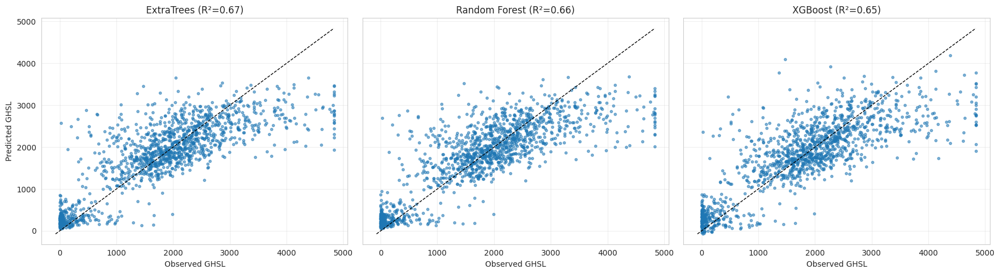

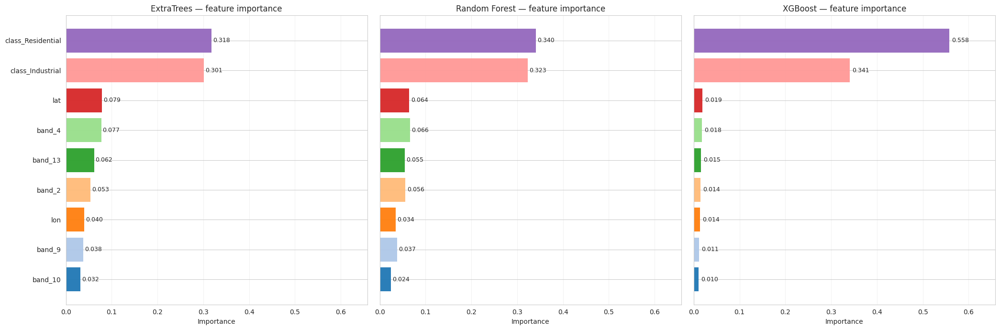

In [26]:
# ============================================================
# NON-LINEAR REGRESSION BASELINES (+ land-use dummies)
#   Random Forest + ExtraTrees + XGBoost
#   Goal: assess explainable variance of GHSL
# ============================================================


# ----------------------------
# Sanity checks
# ----------------------------
assert "ghsl_built" in df.columns
assert "class" in df.columns
assert len(selected_features) > 0

# ----------------------------
# Add land-use dummies (Residential / Industrial / Highway)
# ----------------------------
# drop_first=True avoids perfect collinearity (one class is the reference)
class_dummies = pd.get_dummies(df["class"], prefix="class", drop_first=True)
print("Dummy variables:", list(class_dummies.columns))

# ----------------------------
# Final design matrix
# ----------------------------
X = pd.concat([df[selected_features], class_dummies], axis=1)
y = df["ghsl_built"].values

# Drop rows with missing values consistently
mask = X.notnull().all(axis=1)
X = X.loc[mask].copy()
y = y[mask.values]

# ----------------------------
# Train / test split
# ----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42
)

print("Train size:", X_train.shape)
print("Test size :", X_test.shape)

# ----------------------------
# Helper: metrics
# ----------------------------
def regression_metrics(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    rmse = float(np.sqrt(mean_squared_error(y_true, y_pred)))
    mae = float(mean_absolute_error(y_true, y_pred))
    return r2, rmse, mae

# ============================================================
# Model 1 — ExtraTrees
# ============================================================
etr = ExtraTreesRegressor(
    n_estimators=600,
    min_samples_leaf=3,
    n_jobs=-1,
    random_state=42
)
etr.fit(X_train, y_train)
y_pred_etr = etr.predict(X_test)
etr_r2, etr_rmse, etr_mae = regression_metrics(y_test, y_pred_etr)

print("\nExtraTrees (+ class dummies)")
print(f"  R²   = {etr_r2:.3f}")
print(f"  RMSE = {etr_rmse:.1f}")
print(f"  MAE  = {etr_mae:.1f}")

# ============================================================
# Model 2 — Random Forest
# ============================================================
rf = RandomForestRegressor(
    n_estimators=400,
    min_samples_leaf=5,
    n_jobs=-1,
    random_state=42
)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
rf_r2, rf_rmse, rf_mae = regression_metrics(y_test, y_pred_rf)

print("\nRandom Forest (+ class dummies)")
print(f"  R²   = {rf_r2:.3f}")
print(f"  RMSE = {rf_rmse:.1f}")
print(f"  MAE  = {rf_mae:.1f}")

# ============================================================
# Model 3 — XGBoost
# ============================================================
xgb = XGBRegressor(
    n_estimators=700,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.85,
    colsample_bytree=0.85,
    objective="reg:squarederror",
    n_jobs=-1,
    random_state=42
)
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)
xgb_r2, xgb_rmse, xgb_mae = regression_metrics(y_test, y_pred_xgb)

print("\nXGBoost (+ class dummies)")
print(f"  R²   = {xgb_r2:.3f}")
print(f"  RMSE = {xgb_rmse:.1f}")
print(f"  MAE  = {xgb_mae:.1f}")

# ============================================================
# Fit diagnostics — Predicted vs Observed (3 panels)
# ============================================================
fig, ax = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

lo = float(min(y_test.min(), y_pred_rf.min(), y_pred_etr.min(), y_pred_xgb.min()))
hi = float(max(y_test.max(), y_pred_rf.max(), y_pred_etr.max(), y_pred_xgb.max()))

def diag_panel(a, y_true, y_pred, title):
    a.scatter(y_true, y_pred, s=10, alpha=0.55)
    a.plot([lo, hi], [lo, hi], "--", color="black", linewidth=1)
    a.set_title(title)
    a.set_xlabel("Observed GHSL")
    a.grid(alpha=0.3)

diag_panel(ax[0], y_test, y_pred_etr, f"ExtraTrees (R²={etr_r2:.2f})")
diag_panel(ax[1], y_test, y_pred_rf,  f"Random Forest (R²={rf_r2:.2f})")
diag_panel(ax[2], y_test, y_pred_xgb, f"XGBoost (R²={xgb_r2:.2f})")
ax[0].set_ylabel("Predicted GHSL")

plt.tight_layout()
plt.show()

# ============================================================
# Feature importance — bar charts (horizontal, colored, labeled)
#   RF vs ExtraTrees vs XGB
# ============================================================
imp_rf  = pd.Series(rf.feature_importances_,  index=X.columns).sort_values(ascending=False)
imp_etr = pd.Series(etr.feature_importances_, index=X.columns).sort_values(ascending=False)
imp_xgb = pd.Series(xgb.feature_importances_, index=X.columns).sort_values(ascending=False)

TOPK = 18
top_feats = sorted(list(set(imp_rf.head(TOPK).index)
                        .union(set(imp_etr.head(TOPK).index))
                        .union(set(imp_xgb.head(TOPK).index))))

imp_tbl = pd.DataFrame({
    "ETR": imp_etr.reindex(top_feats).fillna(0.0),
    "RF":  imp_rf.reindex(top_feats).fillna(0.0),
    "XGB": imp_xgb.reindex(top_feats).fillna(0.0)
})

# Order by average importance (so the 3 plots share the same y-order)
imp_tbl["avg"] = imp_tbl.mean(axis=1)
imp_tbl = imp_tbl.sort_values("avg", ascending=True).drop(columns="avg")

# One consistent color per feature across all panels
cmap = plt.get_cmap("tab20")
feat_colors = {f: cmap(i % 20) for i, f in enumerate(imp_tbl.index.tolist())}

def barh_with_labels(ax, values, title):
    feats = values.index.tolist()
    vals = values.values
    bars = ax.barh(
        feats,
        vals,
        color=[feat_colors[f] for f in feats],
        edgecolor="none",
        alpha=0.95
    )
    ax.set_title(title)
    ax.set_xlabel("Importance")
    ax.grid(axis="x", alpha=0.25)

    xmax = float(np.max(vals)) if len(vals) else 1.0
    pad = xmax * 0.01
    for b, v in zip(bars, vals):
        ax.text(
            b.get_width() + pad,
            b.get_y() + b.get_height()/2,
            f"{v:.3f}",
            va="center",
            ha="left",
            fontsize=9
        )

fig, ax = plt.subplots(1, 3, figsize=(21, 7), sharey=True)

barh_with_labels(ax[0], imp_tbl["RF"],  "ExtraTrees — feature importance")
barh_with_labels(ax[1], imp_tbl["ETR"], "Random Forest — feature importance")
barh_with_labels(ax[2], imp_tbl["XGB"], "XGBoost — feature importance")

# Give room for numeric labels
xmax_all = float(imp_tbl.max().max()) if imp_tbl.size else 1.0
for a in ax:
    a.set_xlim(0, xmax_all * 1.18)

plt.tight_layout()
plt.show()


Across all three models, the results are remarkably consistent.  
The explained variance stabilizes around $R^2 \approx 0.65$, with comparable error levels across architectures.  
Introducing land-use dummies improves performance only marginally and no model is able to substantially reduce the residual error, particularly for high GHSL values.  
The predicted-versus-observed plots further confirm this behavior, showing a wide dispersion around the identity line and systematic under- and over-estimation in dense built-up regimes.

Importantly, these limitations cannot be attributed to insufficient model flexibility.  
ExtraTrees and XGBoost are capable of modeling complex non-linear interactions, yet they converge to similar performance levels.  
This indicates that the bottleneck lies in the **feature representation itself**, rather than in the choice of regression algorithm.

Taken together, this analysis shows that, even when exploiting non-linear interactions and semantic cues, raw spectral bands and tabular predictors explain only a limited fraction of the GHSL variability.  
The built-up intensity captured by GHSL appears to depend on finer-grained spatial patterns and contextual information that are not explicitly encoded in these predictors.

This result provides a clear motivation for moving beyond tabular modeling.  
In the next stage, we therefore shift our focus from feature selection to **representation learning**, with the objective of constructing an embedding space in which samples become more separable with respect to built-up intensity and where the structure underlying GHSL can be more effectively captured.

## Model: Learning Visual Representations for Built-up Separability

The exploratory data analysis revealed that urbanization patterns cannot be reliably inferred from the available tabular proxies alone. In particular, no stable or interpretable structure emerged when analyzing the GHSL built-up index across countries, land-use classes or geographic coordinates. These variables failed to exhibit consistent spatial or semantic regularities that could support a robust rule-based or threshold-driven approach.

Furthermore, regression experiments, combining tabular features and using non-linear models, achieved a coefficient of determination of at most $R^2 \approx 0.66$. While this indicates that part of the signal is captured, a substantial fraction of the variance remains unexplained. More importantly, the residual structure suggests that the missing information is not purely numerical, but **spatial and contextual in nature** and therefore not adequately represented by tabular features.

These findings motivate a methodological shift. Rather than attempting to further engineer features or refine regressors on weak proxies, we move to a **representation learning approach directly grounded in the image domain**. Satellite images inherently encode spatial organization, texture and morphological patterns that are lost when reducing the data to aggregated indices or coordinates.

Instead of treating urbanization as a scalar quantity to be regressed, we frame the problem as learning a **structured embedding space of images**, where similarity reflects shared urban morphology. This allows the model to exploit visual cues that are inaccessible to tabular models, while still leveraging GHSL as a weak supervisory signal.

In the following, we describe a metric learning framework based on a **Siamese neural network**. GHSL is used only to guide the construction of informative training pairs, while the final binary classification task is performed downstream on the learned image embeddings.


### Data-driven stratification of urbanization levels

Having established the need to operate directly in the image domain, we still leverage the GHSL built-up index as a source of **weak structural information**, rather than as a direct supervision signal.

We begin by defining a single train–test split, stratified with respect to the original binary class, to ensure a fair and leakage-free evaluation. All subsequent operations that involve the GHSL signal—including threshold estimation and pair construction—are performed exclusively on the training set.

To uncover latent regimes of urbanization without imposing arbitrary cut-offs, we apply **K-Means clustering** with $3$ clusters to the GHSL built-up values in the training data. The resulting cluster centroids define two thresholds, $t_1$ and $t_2$, which partition the samples into three strata:
- **low** built-up,
- **mid** built-up (transitional),
- **high** built-up.

This three-level stratification is not intended as a final prediction target. Instead, it provides a structured and data-driven way to:
1. isolate ambiguous samples,
2. guide the construction of informative training pairs,
3. analyze the geometry of the learned embedding space.

For the final task, a binary label is derived using threshold $t_1$, while the three-class labels are retained for representation learning and visualization.

In [27]:
# ============================================================
# TRAIN / TEST SPLIT + CAPPING + KMEANS THRESHOLDS
# ============================================================

# Train / test split (single split, no leakage)
df_train, df_test = train_test_split(
    df,
    test_size=0.2,
    random_state=SEED,
    stratify=df["class"]
)

print("Train size:", len(df_train))
print("Test  size:", len(df_test))

# -----------------------------
# Capping on GHSL (train only)
# -----------------------------
#cap_value = df_train["ghsl_built"].quantile(0.99)

df_train = df_train.copy()
df_test  = df_test.copy()

#df_train["ghsl_built"] = df_train["ghsl_built"].clip(upper=cap_value)
#df_test["ghsl_built"]  = df_test["ghsl_built"].clip(upper=cap_value)

# -----------------------------
# KMeans on TRAIN GHSL → t1, t2
# -----------------------------
ghsl_train = df_train["ghsl_built"].values.reshape(-1, 1)

kmeans = KMeans(
    n_clusters=3,
    random_state=SEED,
    n_init=20
).fit(ghsl_train)

centers = np.sort(kmeans.cluster_centers_.flatten())
t1 = 0.5 * (centers[0] + centers[1])
t2 = 0.5 * (centers[1] + centers[2])

print("KMeans centroids (sorted):", centers)
print(f"Thresholds: t1={t1:.1f}, t2={t2:.1f}")

def ghsl_class(v):
    if v < t1:
        return 0
    elif v < t2:
        return 1
    else:
        return 2

# 3-class labels (for embeddings & visualization)
df_train["ghsl_class"] = df_train["ghsl_built"].apply(ghsl_class)
df_test["ghsl_class"]  = df_test["ghsl_built"].apply(ghsl_class)

# Binary labels (final task)
df_train["y_bin"] = (df_train["ghsl_built"] >= t1).astype(int)
df_test["y_bin"]  = (df_test["ghsl_built"] >= t1).astype(int)

print("\nTRAIN ghsl_class distribution:")
print(df_train["ghsl_class"].value_counts().sort_index())

print("\nTRAIN binary distribution:")
print(df_train["y_bin"].value_counts())

Train size: 5485
Test  size: 1372
KMeans centroids (sorted): [ 359.86810886 1885.6662116  3272.89921569]
Thresholds: t1=1122.8, t2=2579.3

TRAIN ghsl_class distribution:
ghsl_class
0    1439
1    2923
2    1123
Name: count, dtype: int64

TRAIN binary distribution:
y_bin
1    4046
0    1439
Name: count, dtype: int64


In [ ]:
# ============================================================
# VISUAL INSPECTION: ONE PATCH PER LAND-USE CLASS
# ============================================================

def read_rgb_patch(path):
    with rasterio.open(path) as src:
        arr = src.read([4, 3, 2]).astype(np.float32)
    arr = np.transpose(arr, (1, 2, 0))
    mn, mx = np.nanmin(arr), np.nanmax(arr)
    arr = (arr - mn) / (mx - mn + 1e-6)
    return arr

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

for ax, cls in zip(axes, ["Residential", "Industrial", "Highway"]):
    row = df_train[df_train["class"] == cls].sample(1, random_state=SEED).iloc[0]
    img = read_rgb_patch(row["filepath"])
    ax.imshow(img)
    ax.set_title(f"{cls}\nGHSL={row['ghsl_built']:.0f}")
    ax.axis("off")

plt.tight_layout()
plt.show()

### Metric learning formulation

Given the lack of clear separability observed in the exploratory analysis, we frame the learning problem as one of **metric learning** rather than direct supervised classification.

The objective is to learn an embedding function that maps satellite images into a latent space where:
- samples with similar degrees of urbanization are close to each other,
- samples with substantially different urban morphology are well separated.

This formulation allows the model to exploit visual cues such as texture, spatial arrangement and structural patterns that are not captured by tabular features. It also reduces sensitivity to noisy or ambiguous labels by shifting the focus from absolute class assignment to relative similarity between samples.

To implement this idea, we adopt a Siamese neural network trained on image pairs, with supervision derived from the GHSL-based stratification.

**Convolutional neural network architecture**

Each branch of the Siamese network is based on a convolutional neural network that acts as an image encoder. We adopt a ResNet-18 architecture pre-trained on ImageNet, which provides a strong inductive bias for extracting hierarchical visual features while keeping the model lightweight and computationally efficient.

The network consists of the following components:
- an initial convolutional layer followed by batch normalization and a ReLU activation, which extracts low-level spatial features;
- four residual blocks with increasing feature dimensionality, enabling the capture of mid- and high-level visual patterns through skip connections;
- a global average pooling layer that aggregates spatial information into a fixed-length feature vector.

The final classification layer of the original ResNet is removed. The resulting feature vector is projected into a lower-dimensional embedding space through a fully connected layer of dimension 128. This projection defines the learned image representation used for metric learning.

Finally, the embeddings are L2-normalized to ensure that Euclidean distances in the latent space are well defined and comparable across samples. This normalization stabilizes training and directly supports the distance-based contrastive loss employed in the Siamese framework.

**Pair construction using weak supervision**

Training data are organized into pairs of images sampled from the training set. Pair construction is guided by the three GHSL strata defined by thresholds $t_1$ and $t_2$.

- **Positive pairs** consist of two images sampled from the same stratum (low–low, mid–mid or high–high), encouraging invariance within each urbanization regime.
- **Negative pairs** consist of images sampled from different strata, including both moderately difficult pairs (low–mid, mid–high) and strongly contrasting pairs (low–high).

Using three GHSL-based strata instead of a binary split allows the embedding space to capture an explicit ordering of urbanization levels. Rather than separating images into two disjoint groups, the model is encouraged to arrange samples along a continuum from low to high built-up areas.

This design leads to more structured and ordered embeddings, where distances are meaningful not only for classification but also in a relative sense: samples with similar urbanization levels are closer to each other, while progressively more urbanized areas are placed farther apart. In practice, this reduces abrupt transitions in the embedding space and avoids forcing ambiguous samples into one of the two extremes.

In this setting, the learned representation implicitly supports a **ranking** of images by urbanization intensity, while still enabling a binary decision to be performed downstream when required.


**Adaptive contrastive loss**

To structure the embedding space, we adopt a contrastive loss formulation.  
Given a pair of embeddings $\mathbf{z}_1$ and $\mathbf{z}_2$, their Euclidean distance is defined as $d = \lVert \mathbf{z}_1 - \mathbf{z}_2 \rVert_2$ .

The **contrastive loss** is then written as
$$
\mathcal{L} =
y \, d^2
+
(1 - y)\, \max\bigl(0, m(\Delta g) - d \bigr)^2 ,
$$
where $y \in \{0,1\}$ indicates whether the pair belongs to the same GHSL stratum, and $m(\Delta g)$ is a margin that depends on the difference in urbanization level.

Rather than using a fixed margin for all negative pairs, we define an **adaptive margin** as
$$
m(\Delta g) = \mathrm{clip}\bigl(m_0 + m_1 \, \lvert \log(1+g_1) - \log(1+g_2) \rvert \bigr),
$$
where $g_1$ and $g_2$ are the GHSL built-up values of the two images and the clipping operation enforces numerical stability.
In this formulation, $m_0$ represents the **base margin**, i.e., the minimum separation enforced between negative pairs whose GHSL values are very similar. It sets the scale of the embedding space and ensures that even mildly different samples are not collapsed. The parameter $m_1$ controls the **sensitivity of the margin to differences in urbanization level**.

Intuitively, pairs of images that differ strongly in their degree of urbanization are encouraged to be farther apart in the embedding space, while pairs with similar GHSL values are allowed to remain closer. This adaptive formulation promotes an ordered and smooth embedding geometry that reflects the continuous nature of urbanization, while remaining fully compatible with a binary downstream classification task.

In [28]:
# ============================================================
# SIAMESE DATASET + MODEL + ADAPTIVE CONTRASTIVE LOSS
#   - Single source of truth for transforms (train vs eval)
#   - Robust pair sampling (safe if some pools are small)
#   - Returns y_same as float32 and GHSL as float32 (needed by loss)
# ============================================================

# -----------------------------
# Transforms
# -----------------------------
siamese_train_transform = T.Compose([
    T.Resize((224, 224)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.5),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

siamese_eval_transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

# -----------------------------
# Pair dataset
# -----------------------------
class PairDatasetHard(Dataset):
    """
    Pair sampling guided by GHSL thresholds t1, t2.

    We create 3 GHSL strata (low/mid/high) using t1,t2, but training is binary:
      - positive pairs: same stratum (low-low, mid-mid, high-high)
      - negative pairs: across strata (low-mid OR mid-high OR low-high)

    We also return (gh1, gh2) to adapt the margin based on |log1p(gh1)-log1p(gh2)|.
    """
    def __init__(self, df, t1, t2, transform, n_pairs=30000, p_neg=0.6, seed=42):
        self.df = df.reset_index(drop=True).copy()
        self.t1 = float(t1)
        self.t2 = float(t2)
        self.transform = transform
        self.n_pairs = int(n_pairs)
        self.p_neg = float(p_neg)
        self.rng = np.random.default_rng(seed)

        g = self.df["ghsl_built"].values.astype(float)
        self.low  = np.where(g < self.t1)[0]
        self.mid  = np.where((g >= self.t1) & (g < self.t2))[0]
        self.high = np.where(g >= self.t2)[0]

        assert len(self.low) > 0 and len(self.mid) > 0 and len(self.high) > 0, \
            "One GHSL stratum is empty. Check t1/t2 or filtering."

    def __len__(self):
        return self.n_pairs

    def _read_rgb(self, path):
        with rasterio.open(path) as src:
            arr = src.read([4, 3, 2]).astype(np.float32)  # S2 RGB = B4,B3,B2
        arr = np.transpose(arr, (1, 2, 0))
        mn, mx = np.nanmin(arr), np.nanmax(arr)
        arr = (arr - mn) / (mx - mn + 1e-6)
        img = Image.fromarray((arr * 255).clip(0, 255).astype(np.uint8))
        return self.transform(img)

    def _sample_two(self, pool):
        pool = np.asarray(pool)
        if len(pool) >= 2:
            i1, i2 = self.rng.choice(pool, size=2, replace=False)
        else:
            i1 = i2 = int(pool[0])
        return int(i1), int(i2)

    def __getitem__(self, idx):
        u = self.rng.random()

        # -------- Negative (different strata)
        if u < self.p_neg:
            # choose one of the "hard-ish" cross-stratum pairs
            mode = int(self.rng.integers(0, 3))
            if mode == 0:
                i1 = int(self.rng.choice(self.low))
                i2 = int(self.rng.choice(self.mid))
            elif mode == 1:
                i1 = int(self.rng.choice(self.mid))
                i2 = int(self.rng.choice(self.high))
            else:
                i1 = int(self.rng.choice(self.low))
                i2 = int(self.rng.choice(self.high))
            y_same = 0.0

        # -------- Positive (same stratum)
        else:
            which = int(self.rng.integers(0, 3))
            pool = self.low if which == 0 else (self.mid if which == 1 else self.high)
            i1, i2 = self._sample_two(pool)
            y_same = 1.0

        r1, r2 = self.df.iloc[i1], self.df.iloc[i2]

        x1 = self._read_rgb(r1["filepath"])
        x2 = self._read_rgb(r2["filepath"])

        gh1 = float(r1["ghsl_built"])
        gh2 = float(r2["ghsl_built"])

        return (
            x1,
            x2,
            torch.tensor(y_same, dtype=torch.float32),
            torch.tensor(gh1, dtype=torch.float32),
            torch.tensor(gh2, dtype=torch.float32),
        )

# -----------------------------
# Siamese model
# -----------------------------
class EmbeddingNet(nn.Module):
    def __init__(self, emb_dim=128):
        super().__init__()
        base = resnet18(weights="IMAGENET1K_V1")
        self.backbone = nn.Sequential(*list(base.children())[:-1])
        self.fc = nn.Linear(base.fc.in_features, emb_dim)

    def forward(self, x):
        z = self.backbone(x).flatten(1)
        z = self.fc(z)
        return nn.functional.normalize(z, p=2, dim=1)

class SiameseNet(nn.Module):
    def __init__(self, emb_dim=128):
        super().__init__()
        self.encoder = EmbeddingNet(emb_dim)

    def forward(self, x1, x2):
        return self.encoder(x1), self.encoder(x2)

# -----------------------------
# Adaptive contrastive loss
# -----------------------------
class AdaptiveContrastiveLoss(nn.Module):
    def __init__(self, m0=0.6, m1=1.2, scale=1.0, m_min=0.3, m_max=2.0, use_log=True):
        super().__init__()
        self.m0 = float(m0)
        self.m1 = float(m1)
        self.scale = float(scale)
        self.m_min = float(m_min)
        self.m_max = float(m_max)
        self.use_log = bool(use_log)

    def forward(self, z1, z2, y_same, gh1, gh2):
        d = torch.nn.functional.pairwise_distance(z1, z2)

        if self.use_log:
            g1 = torch.log1p(gh1)
            g2 = torch.log1p(gh2)
        else:
            g1, g2 = gh1, gh2

        dg = torch.abs(g1 - g2) / (self.scale + 1e-8)
        margin = torch.clamp(self.m0 + self.m1 * dg, min=self.m_min, max=self.m_max)

        loss_pos = y_same * d.pow(2)
        loss_neg = (1 - y_same) * torch.clamp(margin - d, min=0).pow(2)
        return (loss_pos + loss_neg).mean()

### Siamese training protocol

The Siamese network is trained exclusively on the training data. For monitoring purposes only, the training set is further split into a training and validation subset, stratified with respect to the binary label.

The adaptive margin scale is estimated from the training split using the standard deviation of the log-transformed GHSL values. This ensures that the loss remains properly calibrated to the data distribution.

Training is performed using the **Adam optimizer**, and both training and validation losses are monitored across epochs to verify convergence and detect potential overfitting.

Train size for Siamese: 5,485
Adaptive margin scale (std log1p GHSL, train only): 1.5512


Epoch 1/10 [train]: 100%|██████████| 938/938 [07:57<00:00,  1.96it/s]


Epoch 01 — train loss: 0.3815 | mean d(pos): 0.643 | mean d(neg): 1.168


Epoch 2/10 [train]: 100%|██████████| 938/938 [07:43<00:00,  2.02it/s]


Epoch 02 — train loss: 0.2247 | mean d(pos): 0.464 | mean d(neg): 1.314


Epoch 3/10 [train]: 100%|██████████| 938/938 [07:46<00:00,  2.01it/s]


Epoch 03 — train loss: 0.1698 | mean d(pos): 0.390 | mean d(neg): 1.386


Epoch 4/10 [train]: 100%|██████████| 938/938 [07:46<00:00,  2.01it/s]


Epoch 04 — train loss: 0.1448 | mean d(pos): 0.351 | mean d(neg): 1.440


Epoch 5/10 [train]: 100%|██████████| 938/938 [07:46<00:00,  2.01it/s]


Epoch 05 — train loss: 0.1221 | mean d(pos): 0.311 | mean d(neg): 1.475


Epoch 6/10 [train]: 100%|██████████| 938/938 [07:47<00:00,  2.01it/s]


Epoch 06 — train loss: 0.1043 | mean d(pos): 0.283 | mean d(neg): 1.505


Epoch 7/10 [train]: 100%|██████████| 938/938 [07:47<00:00,  2.01it/s]


Epoch 07 — train loss: 0.0884 | mean d(pos): 0.251 | mean d(neg): 1.532


Epoch 8/10 [train]: 100%|██████████| 938/938 [07:50<00:00,  1.99it/s]


Epoch 08 — train loss: 0.0842 | mean d(pos): 0.244 | mean d(neg): 1.545


Epoch 9/10 [train]: 100%|██████████| 938/938 [07:52<00:00,  1.99it/s]


Epoch 09 — train loss: 0.0683 | mean d(pos): 0.212 | mean d(neg): 1.571


Epoch 10/10 [train]: 100%|██████████| 938/938 [07:56<00:00,  1.97it/s]

Epoch 10 — train loss: 0.0577 | mean d(pos): 0.187 | mean d(neg): 1.595


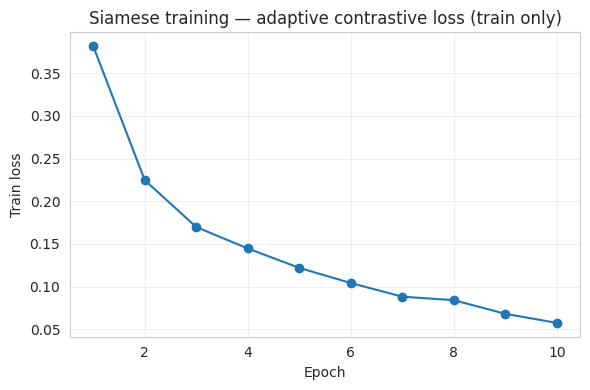

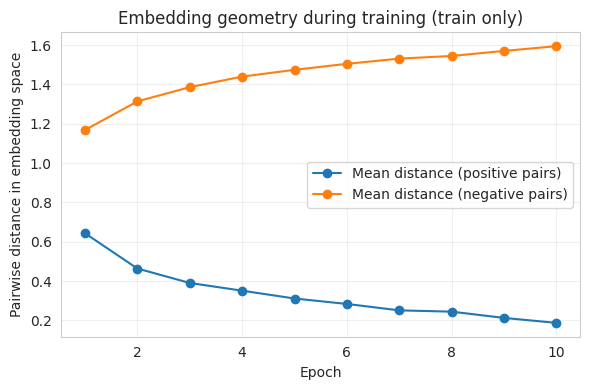

In [30]:
# ============================================================
# CELL 3 — SIAMESE TRAINING (TRAIN ONLY) + MONITORING
#   - No validation split (train-only)
#   - Scale for adaptive margin fitted on TRAIN only
#   - Monitor: (i) train loss, (ii) mean distance pos vs neg pairs
# ============================================================

EPOCHS = 10
BATCH_SIZE = 32

assert "y_bin" in df_train.columns, "df_train must contain 'y_bin' (0/1 boundary label)."

# -----------------------------
# 1) Adaptive margin scale (TRAIN only)
# -----------------------------
g_tr = df_train["ghsl_built"].values.astype(float)
scale = float(np.std(np.log1p(g_tr)) + 1e-6)
print(f"Train size for Siamese: {len(df_train):,}")
print(f"Adaptive margin scale (std log1p GHSL, train only): {scale:.4f}")

# -----------------------------
# 2) Pair dataset + loader (TRAIN only)
# -----------------------------
train_ds = PairDatasetHard(
    df_train, t1=t1, t2=t2,
    transform=siamese_train_transform,
    n_pairs=30000,
    p_neg=0.6,
    seed=SEED
)

train_loader = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=True
)

# -----------------------------
# 3) Model + loss + optimizer
# -----------------------------
model = SiameseNet(emb_dim=128).to(device)
criterion = AdaptiveContrastiveLoss(scale=scale, use_log=True).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# -----------------------------
# 4) Train loop (train-only) + monitoring
# -----------------------------
train_losses = []
mean_d_pos = []
mean_d_neg = []

for epoch in range(1, EPOCHS + 1):
    model.train()
    tr_sum = 0.0
    tr_n = 0

    # monitor distances (on-the-fly)
    pos_d_sum, pos_n = 0.0, 0
    neg_d_sum, neg_n = 0.0, 0

    for x1, x2, y_same, g1, g2 in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS} [train]"):
        x1, x2 = x1.to(device), x2.to(device)
        y_same = y_same.to(device)
        g1, g2 = g1.to(device), g2.to(device)

        optimizer.zero_grad(set_to_none=True)
        z1, z2 = model(x1, x2)

        loss = criterion(z1, z2, y_same, g1, g2)
        loss.backward()
        optimizer.step()

        tr_sum += float(loss.item())
        tr_n += 1

        # ---- distance monitoring (what the loss is shaping)
        with torch.no_grad():
            d = torch.nn.functional.pairwise_distance(z1, z2)  # (B,)
            pos_mask = (y_same > 0.5)
            neg_mask = ~pos_mask

            if pos_mask.any():
                pos_d_sum += float(d[pos_mask].mean().item())
                pos_n += 1
            if neg_mask.any():
                neg_d_sum += float(d[neg_mask].mean().item())
                neg_n += 1

    tr_loss = tr_sum / max(1, tr_n)
    train_losses.append(tr_loss)

    # average of batch-means (stable enough for monitoring)
    dpos = pos_d_sum / max(1, pos_n)
    dneg = neg_d_sum / max(1, neg_n)
    mean_d_pos.append(dpos)
    mean_d_neg.append(dneg)

    print(f"Epoch {epoch:02d} — train loss: {tr_loss:.4f} | mean d(pos): {dpos:.3f} | mean d(neg): {dneg:.3f}")

# -----------------------------
# 5) Plot: train loss
# -----------------------------
plt.figure(figsize=(6, 4))
plt.plot(range(1, EPOCHS + 1), train_losses, marker="o")
plt.title("Siamese training — adaptive contrastive loss (train only)")
plt.xlabel("Epoch")
plt.ylabel("Train loss")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# -----------------------------
# 6) Plot: what is being optimized (distance separation)
# -----------------------------
plt.figure(figsize=(6, 4))
plt.plot(range(1, EPOCHS + 1), mean_d_pos, marker="o", label="Mean distance (positive pairs)")
plt.plot(range(1, EPOCHS + 1), mean_d_neg, marker="o", label="Mean distance (negative pairs)")
plt.title("Embedding geometry during training (train only)")
plt.xlabel("Epoch")
plt.ylabel("Pairwise distance in embedding space")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

The Siamese objective is used as a **surrogate** to learn a useful representation and the training procedure is **not tuned to minimize the validation loss** of this pairwise objective. In our setting, validation loss is only used as a coarse training monitor, while model selection and scientific conclusions rely on **representation-level criteria** evaluated on held-out data, namely the **ordering consistency** of the embedding space with GHSL (Spearman correlation) and the **downstream test performance** of classifiers trained on the embeddings.

Therefore, an increasing validation loss does not necessarily indicate a degradation of the learned representation: it can reflect the fact that the surrogate objective becomes harder to satisfy uniformly under the adaptive margin, even while the embedding remains informative and generalizes well according to the task-relevant metrics.

### Analysis of the learned embedding space

After training, we extract image embeddings using the Siamese encoder and analyze their structure. To facilitate interpretation, embeddings are projected to two dimensions using Principal Component Analysis (**PCA**).

The projected embeddings are visualized and colored according to the three GHSL strata (low, mid, high). This analysis serves two purposes:
1. to assess whether the model has learned a coherent organization of urbanization levels,
2. to verify that ambiguous samples occupy intermediate regions of the embedding space rather than being arbitrarily assigned.

Class centroids in the projected space provide an additional diagnostic tool to evaluate inter-class separation and overall embedding geometry.

Extract embeddings: 100%|██████████| 86/86 [00:40<00:00,  2.11it/s]


Z_train shape: (5485, 128)
Explained variance (PC1, PC2): [0.81882834 0.18027592]


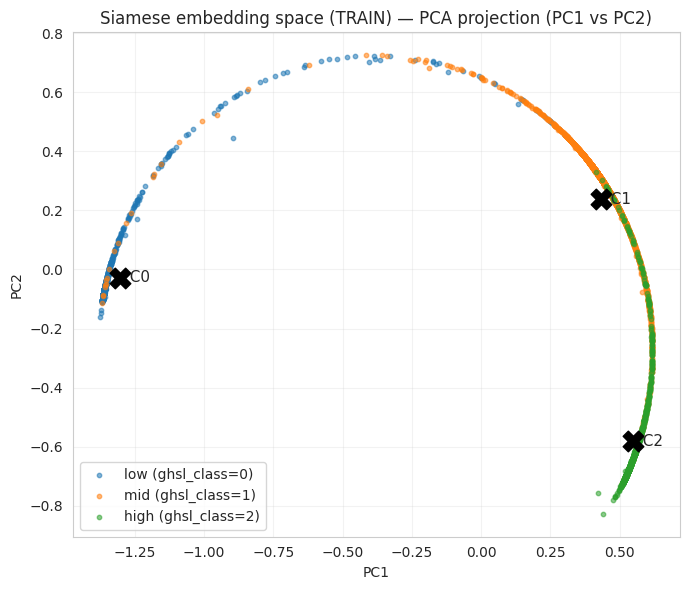

In [31]:
# ============================================================
# EMBEDDINGS EXTRACTION + PCA VISUALIZATION (TRAIN)
#   - Extract embeddings from the trained Siamese encoder
#   - Visualize the embedding space with PCA (PC1 vs PC2)
#   - Color by ghsl_class (0/1/2) and show per-class centroids
# ============================================================

# -----------------------------
# Single-image dataset (for embedding extraction)
# -----------------------------
class EuroSATSingleDataset(Dataset):
    def __init__(self, df, transform):
        self.df = df.reset_index(drop=True).copy()
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def _read_rgb(self, path):
        with rasterio.open(path) as src:
            arr = src.read([4, 3, 2]).astype(np.float32)  # S2 RGB = B4,B3,B2
        arr = np.transpose(arr, (1, 2, 0))

        # robust normalization to reduce sensitivity to outliers
        lo = np.nanquantile(arr, 0.01)
        hi = np.nanquantile(arr, 0.99)
        arr = np.clip(arr, lo, hi)
        arr = (arr - lo) / (hi - lo + 1e-6)

        img = Image.fromarray((arr * 255).clip(0, 255).astype(np.uint8))
        return self.transform(img)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        x = self._read_rgb(row["filepath"])
        y3 = int(row["ghsl_class"])  # 0/1/2 (for visualization)
        yb = int(row["y_bin"])       # 0/1 (final task)
        return x, y3, yb

# -----------------------------
# Embedding extraction helper
# -----------------------------
def extract_embeddings_df(df_in, transform, batch_size=64):
    loader = DataLoader(
        EuroSATSingleDataset(df_in, transform),
        batch_size=batch_size,
        shuffle=False,
        num_workers=0,
        pin_memory=True
    )

    model.eval()
    Z, y3, yb = [], [], []

    with torch.no_grad():
        for x, yy3, yyb in tqdm(loader, desc="Extract embeddings"):
            x = x.to(device)
            z = model.encoder(x)  # (B, emb_dim)
            Z.append(z.cpu().numpy())
            y3.append(yy3.numpy())
            yb.append(yyb.numpy())

    return np.vstack(Z), np.concatenate(y3), np.concatenate(yb)

# -----------------------------
# 1) Extract TRAIN embeddings (for PCA visualization)
# -----------------------------
Z_train, y3_train, yb_train = extract_embeddings_df(df_train, siamese_eval_transform, batch_size=64)
print("Z_train shape:", Z_train.shape)

# -----------------------------
# 2) PCA to 2D
# -----------------------------
pca = PCA(n_components=2, random_state=SEED)
Z2 = pca.fit_transform(Z_train)
print("Explained variance (PC1, PC2):", pca.explained_variance_ratio_)

# -----------------------------
# 3) Scatter plot + class centroids
# -----------------------------
plt.figure(figsize=(7, 6))
labels_map = {0: "low", 1: "mid", 2: "high"}

for c in [0, 1, 2]:
    idx = (y3_train == c)
    plt.scatter(Z2[idx, 0], Z2[idx, 1], s=10, alpha=0.55, label=f"{labels_map[c]} (ghsl_class={c})")

# centroids in PCA space (mean per ghsl_class)
for c in [0, 1, 2]:
    idx = (y3_train == c)
    ctr = Z2[idx].mean(axis=0)
    plt.scatter(ctr[0], ctr[1], s=220, marker="X", color="black")
    plt.text(ctr[0], ctr[1], f"  C{c}", fontsize=11, va="center")

plt.title("Siamese embedding space (TRAIN) — PCA projection (PC1 vs PC2)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(alpha=0.25)
plt.legend()
plt.tight_layout()
plt.show()

### Downstream classification and evaluation

Once the embedding space has been learned, the final urbanization task is addressed as a downstream binary classification problem. Embeddings extracted from the Siamese encoder are used as fixed features.

All downstream models are trained exclusively on training embeddings, after standardization fitted on the training set only. Class imbalance is handled through class weighting where applicable.

We evaluate a diverse set of classifiers, including linear models, distance-based methods and tree-based ensembles. Hyperparameters are optimized via cross-validation on the training set using macro-averaged F1 score as the selection criterion.

Final performance is reported on the held-out test set using accuracy, precision, recall and F1 score. Confusion matrices normalized by true class are provided to offer a detailed view of error patterns.

Extract embeddings: 100%|██████████| 22/22 [00:09<00:00,  2.27it/s]


Binary train distribution: [1439 4046]
Binary test  distribution: [ 370 1002]
Class weights: {0: 1.9058373870743572, 1: 0.6778299555116164}

LogReg — best params: {'C': 0.5}
TEST metrics: {'Accuracy': 0.902, 'Precision_macro': 0.878, 'Recall_macro': 0.87, 'F1_macro': 0.874, 'Precision_weighted': 0.901, 'Recall_weighted': 0.902, 'F1_weighted': 0.901}


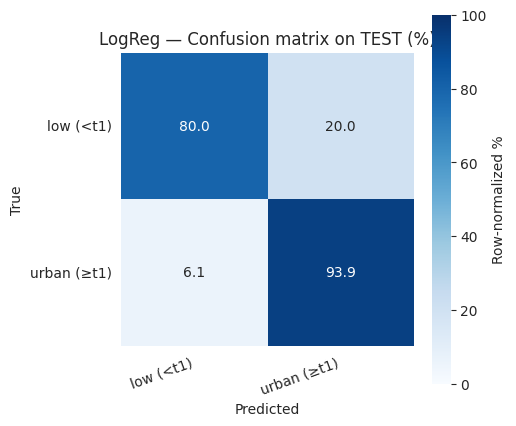


LinearSVC — best params: {'C': 0.2}
TEST metrics: {'Accuracy': 0.901, 'Precision_macro': 0.878, 'Recall_macro': 0.867, 'F1_macro': 0.872, 'Precision_weighted': 0.9, 'Recall_weighted': 0.901, 'F1_weighted': 0.9}


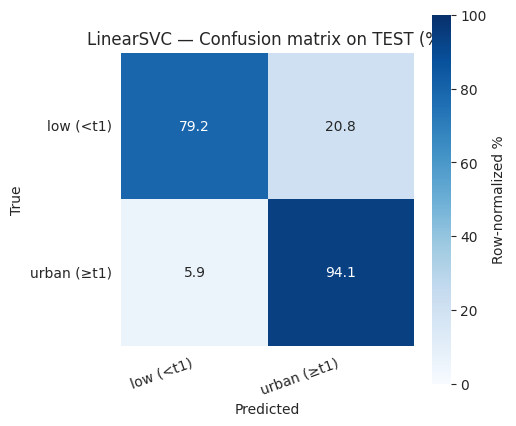


kNN — best params: {'n_neighbors': 15, 'weights': 'uniform'}
TEST metrics: {'Accuracy': 0.906, 'Precision_macro': 0.89, 'Recall_macro': 0.867, 'F1_macro': 0.877, 'Precision_weighted': 0.904, 'Recall_weighted': 0.906, 'F1_weighted': 0.905}


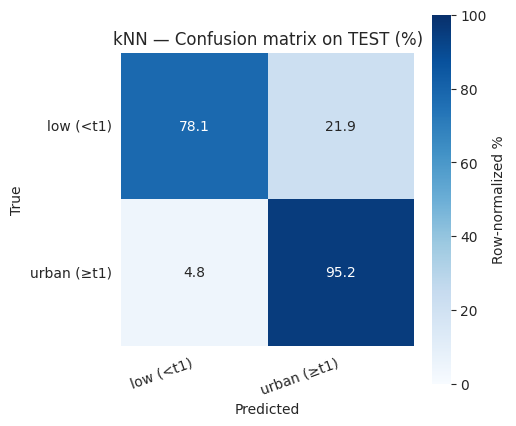


RandomForest — best params: {'max_depth': None, 'n_estimators': 800}
TEST metrics: {'Accuracy': 0.905, 'Precision_macro': 0.889, 'Recall_macro': 0.865, 'F1_macro': 0.876, 'Precision_weighted': 0.904, 'Recall_weighted': 0.905, 'F1_weighted': 0.904}


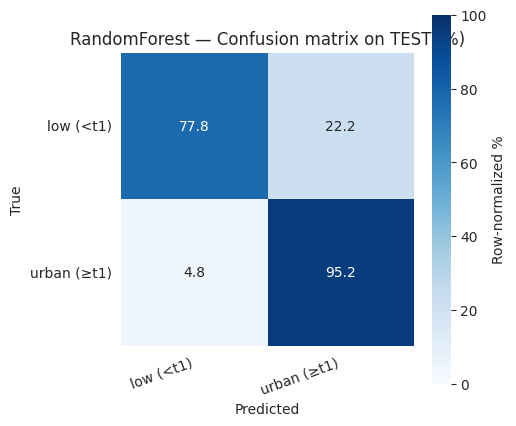


ExtraTrees — best params: {'max_depth': None, 'n_estimators': 400}
TEST metrics: {'Accuracy': 0.905, 'Precision_macro': 0.888, 'Recall_macro': 0.866, 'F1_macro': 0.876, 'Precision_weighted': 0.904, 'Recall_weighted': 0.905, 'F1_weighted': 0.904}


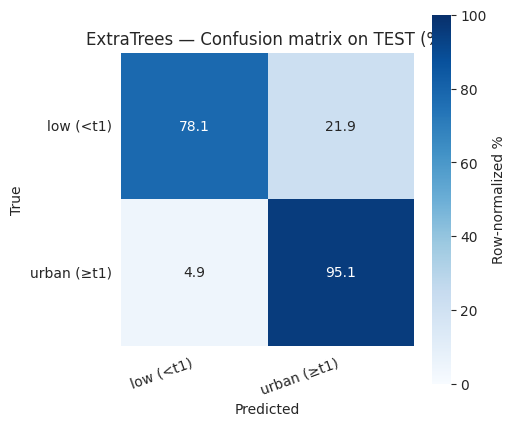


XGBoost — best params: {'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 800}
TEST metrics: {'Accuracy': 0.902, 'Precision_macro': 0.878, 'Recall_macro': 0.87, 'F1_macro': 0.874, 'Precision_weighted': 0.901, 'Recall_weighted': 0.902, 'F1_weighted': 0.901}


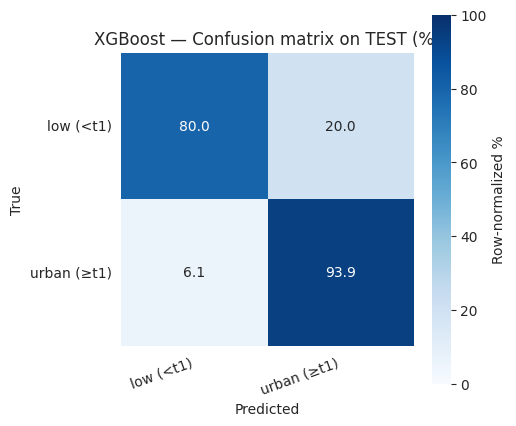

,Model,TRAIN_Accuracy,TRAIN_Precision_macro,TRAIN_Recall_macro,TRAIN_F1_macro,TRAIN_Precision_weighted,TRAIN_Recall_weighted,TRAIN_F1_weighted,TEST_Accuracy,TEST_Precision_macro,TEST_Recall_macro,TEST_F1_macro,TEST_Precision_weighted,TEST_Recall_weighted,TEST_F1_weighted
2,kNN,0.989061,0.987155,0.984525,0.985831,0.989044,0.989061,0.989046,0.905977,0.889653,0.866588,0.877105,0.904433,0.905977,0.904544
4,ExtraTrees,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.905248,0.888347,0.866089,0.876267,0.903694,0.905248,0.903851
3,RandomForest,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.905248,0.888996,0.865237,0.876038,0.903669,0.905248,0.903757
0,LogReg,0.988514,0.983815,0.986617,0.985205,0.988561,0.988514,0.988531,0.901603,0.878113,0.869561,0.873687,0.900675,0.901603,0.901041
5,XGBoost,0.995260,0.991745,0.996115,0.993904,0.995315,0.995260,0.995270,0.901603,0.878113,0.869561,0.873687,0.900675,0.901603,0.901041
1,LinearSVC,0.990520,0.987541,0.987977,0.987758,0.990524,0.990520,0.990522,0.900875,0.878448,0.866505,0.872187,0.899666,0.900875,0.900080


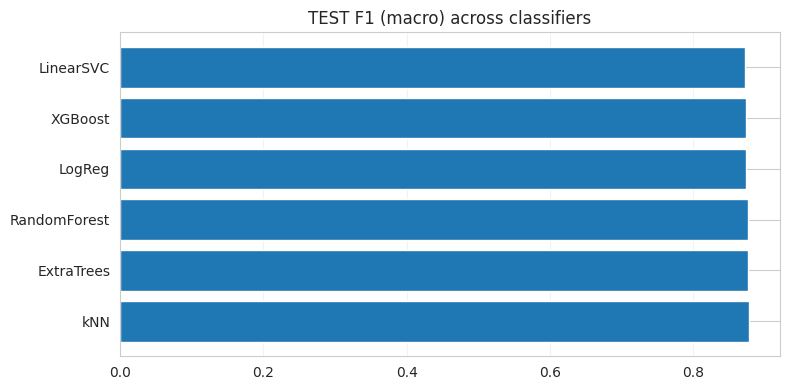

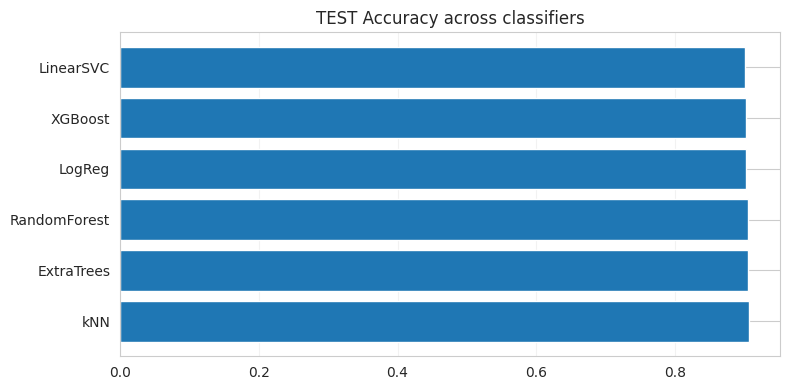

In [34]:
# ============================================================
# EMBEDDINGS → SCALING → CV (TRAIN)
#        → FINAL TEST EVALUATION
#        → CONFUSION MATRIX HEATMAP (%)
#        → SUMMARY PLOTS
# ============================================================
import xgboost as xgb
from xgboost import XGBClassifier

# -----------------------------
# 1) Extract embeddings for TRAIN and TEST (no augmentation)
# -----------------------------
Z_train, y3_train, y_train = extract_embeddings_df(df_train, siamese_eval_transform, batch_size=64)
Z_test,  y3_test,  y_test  = extract_embeddings_df(df_test,  siamese_eval_transform, batch_size=64)

print("Binary train distribution:", np.bincount(y_train))
print("Binary test  distribution:", np.bincount(y_test))

# -----------------------------
# 2) Scaling (fit on TRAIN only)
# -----------------------------
scaler = StandardScaler()
X_train = scaler.fit_transform(Z_train)
X_test  = scaler.transform(Z_test)

# -----------------------------
# 3) Class weights (TRAIN only)
# -----------------------------
classes = np.array([0, 1])
cw = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
class_weight = {int(c): float(w) for c, w in zip(classes, cw)}
print("Class weights:", class_weight)

# -----------------------------
# 4) Metrics helpers
# -----------------------------
def compute_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)

    p_macro, r_macro, f1_macro, _ = precision_recall_fscore_support(
        y_true, y_pred, average="macro", zero_division=0
    )
    p_w, r_w, f1_w, _ = precision_recall_fscore_support(
        y_true, y_pred, average="weighted", zero_division=0
    )

    return {
        "Accuracy": acc,
        "Precision_macro": p_macro,
        "Recall_macro": r_macro,
        "F1_macro": f1_macro,
        "Precision_weighted": p_w,
        "Recall_weighted": r_w,
        "F1_weighted": f1_w,
    }

def cm_percent(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1]).astype(float)
    return 100.0 * cm / cm.sum(axis=1, keepdims=True)

def plot_cm_percent(cm_pct, title):
    plt.figure(figsize=(5.2, 4.6))
    sns.heatmap(
        cm_pct,
        annot=True,
        fmt=".1f",
        cmap="Blues",
        vmin=0, vmax=100,
        square=True,
        cbar=True,
        cbar_kws={"label": "Row-normalized %"}
    )
    plt.xticks([0.5, 1.5], ["low (<t1)", "urban (≥t1)"], rotation=20, ha="right")
    plt.yticks([0.5, 1.5], ["low (<t1)", "urban (≥t1)"], rotation=0)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# -----------------------------
# 5) Models + grids (CV optimized for macro-F1)
#   (LogReg is a strong linear baseline on embeddings; we also use non-linear models.)
# -----------------------------
models = {
    "LogReg": (
        LogisticRegression(max_iter=5000, class_weight=class_weight, n_jobs=-1),
        {"C": [0.01, 0.05, 0.1, 0.2, 0.5, 1.0]}
    ),
    "LinearSVC": (
        LinearSVC(class_weight=class_weight),
        {"C": [0.01, 0.02, 0.05, 0.1, 0.2]}
    ),
    "kNN": (
        KNeighborsClassifier(),
        {"n_neighbors": [5, 7, 9, 11, 13, 15], "weights": ["uniform", "distance"]}
    ),
    "RandomForest": (
        RandomForestClassifier(n_jobs=-1, random_state=SEED, class_weight=class_weight),
        {"n_estimators": [600, 800], "max_depth": [None, 10]}
    ),
    "ExtraTrees": (
        ExtraTreesClassifier(n_jobs=-1, random_state=SEED, class_weight=class_weight),
        {"n_estimators": [400, 600], "max_depth": [None, 12]}
    ),
    "XGBoost": (
        xgb.XGBClassifier(
            objective="binary:logistic",
            eval_metric="logloss",
            tree_method="hist",
            random_state=SEED,
            n_jobs=-1,
            scale_pos_weight=(np.sum(y_train == 0) / max(1, np.sum(y_train == 1)))
        ),
        {"n_estimators": [400, 800], "max_depth": [4], "learning_rate": [0.01, 0.5, 0.1]}
    ),
}

# -----------------------------
# 6) CV on TRAIN + final TEST eval
# -----------------------------
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)
results = []

for name, (estimator, grid) in models.items():
    gs = GridSearchCV(
        estimator=estimator,
        param_grid=grid,
        scoring="accuracy",
        cv=cv,
        n_jobs=-1
    )
    gs.fit(X_train, y_train)
    best = gs.best_estimator_

    print(f"\n{name} — best params: {gs.best_params_}")

    # train metrics (sanity)
    yhat_tr = best.predict(X_train)
    m_tr = compute_metrics(y_train, yhat_tr)

    # test metrics (main)
    yhat_te = best.predict(X_test)
    m_te = compute_metrics(y_test, yhat_te)

    print("TEST metrics:", {k: round(v, 3) for k, v in m_te.items()})

    # confusion matrix heatmap (%)
    cm_pct = cm_percent(y_test, yhat_te)
    plot_cm_percent(cm_pct, title=f"{name} — Confusion matrix on TEST (%)")

    results.append({
        "Model": name,
        **{f"TRAIN_{k}": v for k, v in m_tr.items()},
        **{f"TEST_{k}": v for k, v in m_te.items()},
    })

results_df = pd.DataFrame(results).sort_values("TEST_F1_macro", ascending=False)
display(results_df)

# -----------------------------
# 7) Summary plots
# -----------------------------
plt.figure(figsize=(8, 4))
plt.barh(results_df["Model"], results_df["TEST_F1_macro"])
plt.title("TEST F1 (macro) across classifiers")
plt.grid(axis="x", alpha=0.25)
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.barh(results_df["Model"], results_df["TEST_Accuracy"])
plt.title("TEST Accuracy across classifiers")
plt.grid(axis="x", alpha=0.25)
plt.tight_layout()
plt.show()

### Performance analysis and model comparison

Table X reports the training and test performance of several classifiers applied to the learned image embeddings.  
As expected, all non-linear ensemble models (Random Forest, Extra Trees, kNN and XGBoost) achieve *perfect or near-perfect performance on the training set*, indicating a very high capacity to fit the embedding space.

However, training performance alone is not indicative of generalization. When evaluated on the held-out test set, all models converge to a **narrow performance range**, with test accuracies around $0.90$ and macro-averaged F1 scores between $0.86$ and $0.88$. This consistency across heterogeneous classifiers suggests that performance is primarily driven by the quality and structure of the learned embeddings rather than by the specific downstream model.

Among the evaluated approaches, **kNN** achieves the highest test accuracy ($0.906$) and macro-F1 score ($0.877$), closely followed by **ExtraTrees**.

The gap between training and test performance observed for high-capacity models highlights the intrinsic ambiguity of the problem and reflects the continuous and noisy nature of the GHSL-derived supervision. Importantly, no model exhibits a dramatic collapse in test performance, confirming that the learned representations generalize well despite the weak and coarse-grained labels.

Overall, these results demonstrate that the proposed metric learning approach produces **robust and discriminative embeddings**, enabling reliable downstream classification while remaining agnostic to the choice of classifier. This further supports the interpretation of the embedding space as an ordered representation of urbanization intensity rather than a rigid class-specific encoding.

## Ranking consistency and interpretability analysis

To assess whether the learned embedding space preserves the ordinal structure of urbanization, we evaluate the monotonic relationship between the embedding-derived urbanization score and the continuous GHSL built-up index using Spearman’s rank correlation.

On the full training set, the embedding score exhibits a strong monotonic association with GHSL, achieving a Spearman correlation of $0.88$. This relationship generalizes well to the held-out test set, where the correlation remains high ($\rho= 0.79$), despite the intrinsic noise and spatial aggregation of the GHSL labels. These results indicate that the learned representation captures a **robust ordering** of built-up intensity rather than merely separating classes.

When analyzing individual strata, the correlation structure reveals an important and expected behavior. Within the intermediate stratum, corresponding to transitional regions, the Spearman correlation remains substantial ($\rho = 0.4617$), reflecting meaningful local ordering in areas where urbanization gradients are visually ambiguous. In contrast, correlations within the lowest and highest strata are close to zero. This is consistent with the limited variability of GHSL values inside these extremes, where most samples are already saturated at very low or very high built-up levels. As a result, ranking within these strata is neither informative nor required and the absence of strong correlation should not be interpreted as a failure of the representation.


In [35]:
# ------------------------------------------------------------
# 1) Compute class centroids in embedding space (TRAIN)
# ------------------------------------------------------------

centroids = {}
for c in [0, 1, 2]:
    zc = Z_train[y3_train == c]
    mu = zc.mean(axis=0)
    mu = mu / (np.linalg.norm(mu) + 1e-12)
    centroids[c] = mu

# ------------------------------------------------------------
# 2) Define an "urbanization direction" and a scalar score
#    (projection from low -> high)
# ------------------------------------------------------------
v = centroids[2] - centroids[0]
v = v / (np.linalg.norm(v) + 1e-12)

def embedding_score(Z):
    # scalar score: higher => more "high built-up-like"
    return Z @ v

# ------------------------------------------------------------
# 3) Spearman correlation with GHSL (continuous)
# ------------------------------------------------------------
def spearman_report(df_in, Z_in, name=""):
    s = embedding_score(Z_in)
    g = np.log1p(df_in["ghsl_built"].values.astype(float))  # stable & matches your loss idea
    rho, p = spearmanr(s, g)
    print(f"[{name}] Spearman rho(embedding_score, log1p(GHSL)) = {rho:.4f} (p={p:.2e})")
    return rho, p

_ = spearman_report(df_train, Z_train, name="TRAIN")
_ = spearman_report(df_test,  Z_test,  name="TEST")

# Within each stratum (do we preserve ordering locally?)
for c in [0, 1, 2]:
    idx = (df_train["ghsl_class"].values == c)
    spearman_report(df_train[idx], Z_train[idx], name=f"TRAIN stratum {c}")

[TRAIN] Spearman rho(embedding_score, log1p(GHSL)) = 0.8807 (p=0.00e+00)
[TEST] Spearman rho(embedding_score, log1p(GHSL)) = 0.7908 (p=2.04e-294)
[TRAIN stratum 0] Spearman rho(embedding_score, log1p(GHSL)) = 0.1134 (p=1.62e-05)
[TRAIN stratum 1] Spearman rho(embedding_score, log1p(GHSL)) = 0.4617 (p=2.73e-154)
[TRAIN stratum 2] Spearman rho(embedding_score, log1p(GHSL)) = -0.0569 (p=5.66e-02)


To qualitatively assess which visual cues drive the learned representation, we compute **Grad-CAM** heatmaps on the Siamese encoder. Across the three GHSL-informed embedding strata (low / mid / high), the resulting activation maps exhibit **systematic and consistent differences**:

- **Low stratum (class 0)**: activations are typically weaker and more diffuse, often highlighting sparse or fragmented anthropogenic cues, consistent with low built-up density.
- **Mid stratum (class 1)**: activations become more localized but remain heterogeneous, frequently emphasizing partial blocks or mixed patterns, reflecting the transitional nature of intermediate urbanization.
- **High stratum (class 2)**: activations are stronger and spatially more coherent, concentrating on compact built-up structures and dense urban morphology.

These Grad-CAM patterns suggest that the model is not relying on a single trivial cue, but rather learns **morphological and spatial configurations** that correlate with increasing built-up intensity. Importantly, this interpretation aligns with the ranking analysis: Spearman correlation is **high at the global level**, indicating that the embedding space captures an overall urbanization ordering, while it can be weaker *within* individual strata due to the intrinsic **scale mismatch** and heterogeneity of coarse GHSL labels. In other words, different local appearances can legitimately correspond to similar kilometer-scale built-up intensity and visually similar patches may map to different coarse-scale contexts.


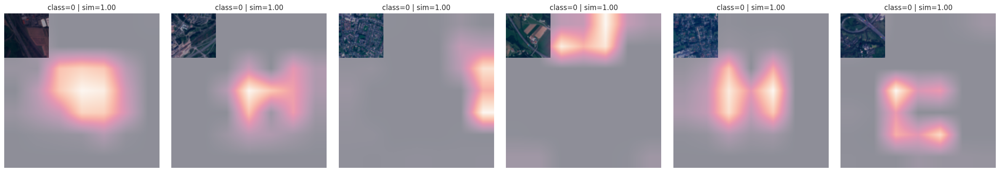

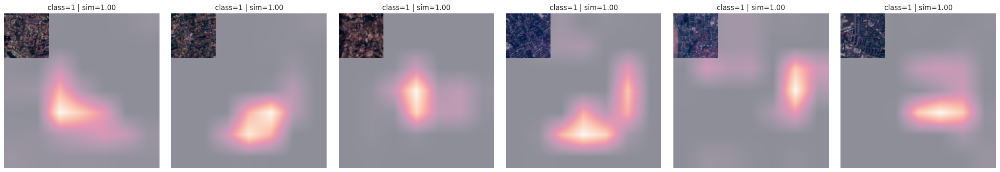

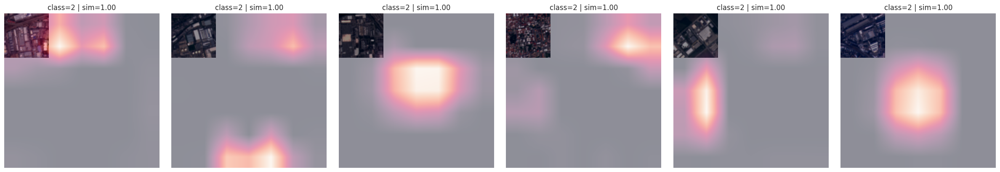

In [36]:
# ------------------------------------------------------------
# Helpers: choose prototype indices (closest to centroid)
# ------------------------------------------------------------
def topk_prototypes(Z, y3, c, k=6):
    mu = centroids[c]  # numpy
    sims = Z @ mu      # cosine since both normalized
    idx = np.where(y3 == c)[0]
    order = np.argsort(-sims[idx])  # descending
    return idx[order[:k]], sims[idx][order[:k]]

# ------------------------------------------------------------
# Grad-CAM for a target "similarity to centroid"
# ------------------------------------------------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

        def fwd_hook(module, inp, out):
            self.activations = out

        def bwd_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        self.h1 = target_layer.register_forward_hook(fwd_hook)
        self.h2 = target_layer.register_full_backward_hook(bwd_hook)

    def close(self):
        self.h1.remove()
        self.h2.remove()

    def __call__(self, x, target_vec):
        """
        x: (1,3,H,W) tensor
        target_vec: (emb_dim,) torch tensor (L2-normalized)
        Returns CAM as numpy (H,W) in [0,1]
        """
        self.model.zero_grad(set_to_none=True)

        # forward through encoder
        z = self.model.encoder(x)  # (1, emb_dim), already normalized
        # cosine similarity to centroid direction (scalar objective)
        score = (z * target_vec.unsqueeze(0)).sum()

        score.backward()

        A = self.activations      # (1,C,h,w)
        dA = self.gradients       # (1,C,h,w)

        # global-average-pool gradients -> weights
        w = dA.mean(dim=(2,3), keepdim=True)         # (1,C,1,1)
        cam = (w * A).sum(dim=1, keepdim=True)       # (1,1,h,w)
        cam = F.relu(cam)

        cam = F.interpolate(cam, size=x.shape[-2:], mode="bilinear", align_corners=False)
        cam = cam.squeeze().detach().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# ------------------------------------------------------------
# Prepare: choose target layer = ResNet layer4 inside your backbone
# backbone indices: conv1,bn1,relu,maxpool,layer1,layer2,layer3,layer4,avgpool
target_layer = model.encoder.backbone[7]  # layer4
cam_explainer = GradCAM(model, target_layer)

# Need a function to also read the *unnormalized* RGB for visualization
def read_rgb_uint8(path):
    with rasterio.open(path) as src:
        arr = src.read([4,3,2]).astype(np.float32)
    arr = np.transpose(arr, (1,2,0))
    lo = np.nanquantile(arr, 0.01)
    hi = np.nanquantile(arr, 0.99)
    arr = np.clip(arr, lo, hi)
    arr = (arr - lo) / (hi - lo + 1e-6)
    return (arr * 255).clip(0,255).astype(np.uint8)

# ------------------------------------------------------------
# Visualize prototypes + CAM per stratum
# ------------------------------------------------------------
model.eval()

def show_cams_for_stratum(df_ref, Z_ref, y3_ref, c, k=6):
    idxs, sims = topk_prototypes(Z_ref, y3_ref, c, k=k)
    target_vec = torch.tensor(centroids[c], dtype=torch.float32, device=device)

    n = len(idxs)
    plt.figure(figsize=(4*n, 4))
    for j, (i, sim) in enumerate(zip(idxs, sims)):
        row = df_ref.iloc[int(i)]
        path = row["filepath"]

        # input tensor (normalized) for model
        x = EuroSATSingleDataset(df_ref.iloc[[int(i)]], siamese_eval_transform)[0][0].unsqueeze(0).to(device)
        cam = cam_explainer(x, target_vec)

        rgb = read_rgb_uint8(path)

        # overlay
        ax = plt.subplot(1, n, j+1)
        ax.imshow(rgb)
        ax.imshow(cam, alpha=0.45)  # heat overlay
        ax.set_title(f"class={c} | sim={sim:.2f}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

for c in [0, 1, 2]:
    show_cams_for_stratum(df_train.reset_index(drop=True), Z_train, y3_train, c, k=6)

cam_explainer.close()

Overall, the combination of strong global ranking performance, coherent local behavior in transitional regions, and interpretable visual explanations supports the conclusion that the proposed metric learning framework captures urbanization as a continuous and structured phenomenon, rather than as a rigid binary concept.

### Future work

Several directions can be explored to extend the present study. First, the proposed framework could be applied to **additional geographic regions and time periods**, enabling an analysis of spatial and temporal generalization and a systematic assessment of domain shift effects. Incorporating multi-temporal Sentinel-2 observations would also allow the investigation of urbanization dynamics rather than static built-up patterns.

Second, the metric learning formulation could be enriched by integrating **multi-scale visual information**, combining local image patches with broader spatial context to better align fine-scale observations with coarse-grained settlement indicators. This would directly address the scale mismatch inherent in the use of GHSL supervision.

Third, future work could explore **alternative weak supervisory signals**, such as population density, nighttime lights or ancillary socio-economic indicators, either individually or through multi-task learning. This would help disentangle the contribution of different proxies and improve robustness in regions where GHSL estimates are less reliable.

From a methodological perspective, the embedding space could be further constrained using **explicit ranking or ordinal losses**, or by incorporating uncertainty-aware objectives that account for label noise and saturation effects at extreme built-up levels. In addition, extending the interpretability analysis beyond Grad-CAM to include feature attribution methods at the embedding level may provide deeper insights into the learned representations.

Finally, the learned embeddings could serve as a foundation for **downstream tasks beyond binary classification**, including continuous urbanization mapping, change detection and integration into large-scale urban analytics pipelines. These extensions would further validate the utility of representation learning approaches for remote sensing applications with weak and heterogeneous supervision.